# Processo seletivo datarisk
### Notebook do Case - Modelo preditivo para aprovação de crédito

## 1. Introdução


### 1.1 Contexto e descrição do problema do projeto

Modelos de score de crédito calculam a probabilidade de inadimplência e são uma das
principais ferramentas utilizadas por diversas empresas para aprovar ou negar um
crédito.
O objetivo deste desafio é criar um modelo preditivo calculando a probabilidade de
inadimplência de cada novo pedido de crédito.



### 1.2 Descrição do conjunto de dados

Cada linha representa um cliente e as colunas representam os dados (informações) desses
clientes.
A variável resposta é a coluna inadimplente, que indica se o tomador veio a se tornar
inadimplente(1) ou não(0).
As variáveis da base de dados são descritas abaixo:

    - idade: A idade do cliente..
    - numero_de_dependentes: O número de pessoas dependentes do cliente.
    - salario_mensal: Salário mensal do cliente.
    - numero_emprestimos_imobiliarios: Quantidade de empréstimos imobiliários que o cliente possui em aberto.
    - numero_vezes_passou_90_dias: Número de vezes que o tomador passou mais de 90 dias em atraso.
    - util_linhas_inseguras: Quanto que o cliente está usando, relativamente ao limite dele, de linhas de crédito que não são seguradas por qualquer bem do tomador e.g: imoveis, carros etc.
    - vezes_passou_de_30_59_dias: Número de vezes que o cliente atrasou, entre 30 e 59 dias, o pagamento de um empréstimo.
    - razao_debito: Razão entre as dívidas e o patrimônio do tomador. razão débito = Dividas/Patrimônio
    - numero_linhas_crdto_aberto: Número de empréstimos em aberto pelo cliente.
    - numero_de_vezes_que_passou_60_89_dias: Número de vezes que o cliente atrasou, entre 60 e 89 dias, o pagamento de um empréstimo.

Obs: Estes dados foram retirados de terceiros, portanto é possível que existam
incoerências, o que é perfeitamente comum em dados reais.



### 1.3 Visão geral da metodologia

Neste projeto, a metodologia CRISP (Cross-Industry Standard Process) foi adotada para projetos de mineração e análise de dados. A metodologia CRISP é uma estrutura amplamente utilizada que fornece uma abordagem estruturada para orientar um projeto do início ao fim. Ela consiste de seis fases principais, a saber, Compreensão do Negócio, Compreensão de Dados, Preparação de Dados, Modelagem, Avaliação e Implantação.

A metodologia foi escolhida devido à sua natureza cíclica, o que permite a melhoria contínua do projeto. O processo cíclico significa que após a fase de implantação, os resultados do projeto são revisados, e melhorias podem ser feitas em iterações futuras. Além disso, a metodologia proporciona uma abordagem sistemática e rigorosa do projeto de ciência dos dados, assegurando que as metas e objetivos sejam alcançados de forma estruturada e eficiente.

A metodologia foi adaptada para se adequar às necessidades específicas do projeto. Embora a fase de implantação seja uma parte crítica da metodologia CRISP, foi decidido deixá-la fora do escopo deste projeto. Portanto, o foco será nas cinco primeiras fases da metodologia CRISP, que são Compreensão do Negócio, Compreensão de Dados, Preparação de Dados, Modelagem e Avaliação.


### 1.4 Bibliotecas utilizadas

In [ ]:
# Importando as bibliotecas necessárias

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# Bibliotecas do PyCaret
from pycaret.classification import *

# Bibliotecas de pré-processamento de dados
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.combine import SMOTEENN
from sklearn.preprocessing import RobustScaler
from feature_engine.transformation import YeoJohnsonTransformer
from feature_engine.outliers import Winsorizer

# Bibliotecas de análise exploratória de dados
from ydata_profiling import ProfileReport
import missingno

# Bibliotecas de avaliação de modelos
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, StratifiedKFold
from sklearn.metrics import plot_confusion_matrix, ConfusionMatrixDisplay, classification_report, precision_recall_curve, auc, plot_precision_recall_curve, plot_roc_curve, roc_auc_score
from imblearn.metrics import classification_report_imbalanced

# Bibliotecas de algoritmos de aprendizado de máquina
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC

# Bibliotecas de otimização de hiperparâmetros
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, fbeta_score

# Outras
import datetime
import pickle

## 2. Compreensão e exploração dos dados

### 2.1 Carregamento dos dados


In [2]:
treino = pd.read_csv('treino.csv')
teste = pd.read_csv('teste.csv')

### 2.2 Framework de validação


In [136]:
def split_data(treino, rand=1):
    # Crie as matrizes de atributos (X) e objetivo (y) para todo o conjunto de dados
    X = treino.drop('inadimplente', axis=1)
    y = treino.inadimplente

    # Separe o conjunto de dados em conjuntos de treinamento completo e teste com uma taxa de 0,2 e estratificação por "inadimplente"
    X_full_train, X_test, y_full_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand, stratify=y)

    # Divida ainda mais o conjunto de treinamento completo em conjuntos de treinamento e validação com uma taxa de 0,25 e estratificação por "inadimplente"
    X_train, X_val, y_train, y_val = train_test_split(X_full_train, y_full_train, test_size=0.25, random_state=rand, stratify=y_full_train)

    # Print do comprimento dos conjuntos de treinamento, validação e teste
    print('Treino:', len(X_train),'Validação:', len(X_val),'Teste:', len(X_test))

    return X_full_train, y_full_train, X_test, y_test, X_train, y_train, X_val, y_val
X_full_train, y_full_train, X_test, y_test, X_train, y_train, X_val, y_val = split_data(treino)

Treino: 66000 Validação: 22000 Teste: 22000


### 2.3 Visualização e análise exploratória dos dados


Nesta seção, será realizada uma análise exploratória de dados (EDA) no conjunto de dados de treinamento usando a biblioteca ydata profiling (antigamente chamada pandas profilling) para obter insights e prepará-los para modelagem. Esta ferramenta poderosa gera relatórios detalhados sobre o conjunto de dados, fornecendo uma maneira rápida de entender a distribuição de valores, identificar valores ausentes ou duplicados e destacar problemas potenciais. Ela também nos ajudará a descobrir padrões e tendências importantes que podem orientar decisões de pré-processamento e modelagem, além de fornecer visualizações e estatísticas resumidas para comunicação das descobertas.

In [4]:
profile = ProfileReport(X_full_train, title="Relatório do conjunto de treinamento")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

A análise dos dados revelou que:
 - As classes estão extremamente desbalanceadas (93.7% vs 6.7%);
 - Dois atributos (salario_mensal e numero_de_dependentes) contém valores nulos ou faltantes;
 - Os atributos vezes_passou_de_30_59_dias, numero_vezes_passou_90_dias, numero_de_vezes_que_passou_60_89_dias e numero_de_dependentes são compostos majoritariamente por zeros;
 - Os histogramas revelam que a maioria dos atributos possuem distribuições extremamente assimétricas.

Dessa forma, é necessário, respectivamente:
- Utilizar estratégias de balanceamento dos dados (atribuição de pesos, undersampling ou oversampling) ou então empregar um modelo de identificação de outliers (isolation forest, por exemplo);
- Tratar os valores nulos, imputando novos valores (média, mediana, moda, ou como algoritmo KNN) e/ou excluindo os atributos/exemplos com valores nulos;
- Considerar transformar atributos com muitos zeros em atributos binários (0 ou maior que 0);
- Excluir/modificar outliers, transformar a escala (log, recíproca, box-cox, etc.) ou escalonar os atributos com distribuições assimétricas.

## 3. Feature Engineering


Nesta etapa, exploraremos as quatro áreas-chave do feature engineering:
- Imputação de valores ausentes;
- Descretização de variáveis binárias;
- Transformações de escalas;
- Tratamento de variáveis com outliers;

Ao final desta seção, teremos limpo e preparado os dados para a modelagem.

In [5]:
# Função para plotar um histograma e um gráfico Q-Q lado a lado para uma determinada variável em um dataframe

def diagnostic_plots(df, variable):
    
    import matplotlib.pyplot as plt
    import scipy.stats as stats
    
    # Cria uma figura com tamanho 15 por 6 polegadas
    plt.figure(figsize=(15, 6))

    # Plota um histograma da variável
    plt.subplot(1, 2, 1)
    df[variable].hist(bins=30)
    plt.title(f"Histograma de {variable}")

    # Plota o gráfico Q-Q da variável
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title(f"Gráfico Q-Q de {variable}")

    # Mostra o gráfico
    plt.show()


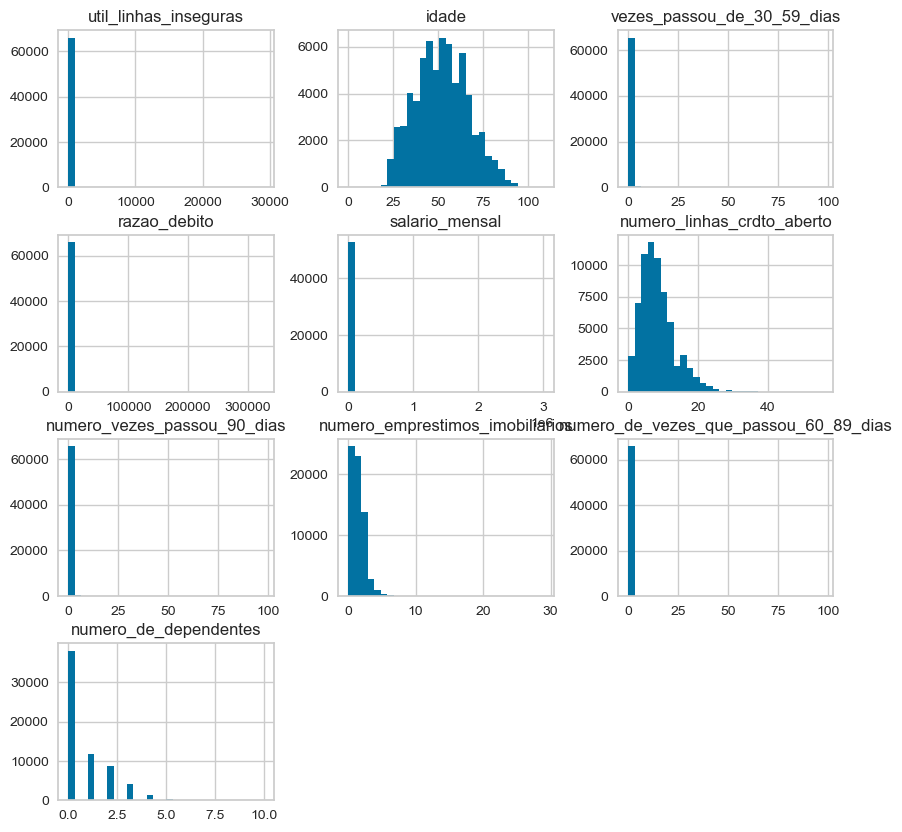

In [6]:
# Plota um histograma para cada variável em X_train (para usar de referência)
X_train.hist(bins=30, figsize=(10, 10), layout=(4, 3));

### 3.1 Variáveis com dados faltantes

In [7]:
# Seleciona as variáveis que possuem valores faltantes
variaveis_com_faltantes = ['salario_mensal', 'numero_de_dependentes']

# Cria um novo DataFrame a partir do conjunto de treinamento
df_faltantes = X_train.copy()

# Cria uma nova coluna "faltantes" que indica se a variável possui valor faltante
df_faltantes.loc[(df_faltantes.salario_mensal.isnull()) | (df_faltantes.numero_de_dependentes.isnull()),'faltantes'] = 1

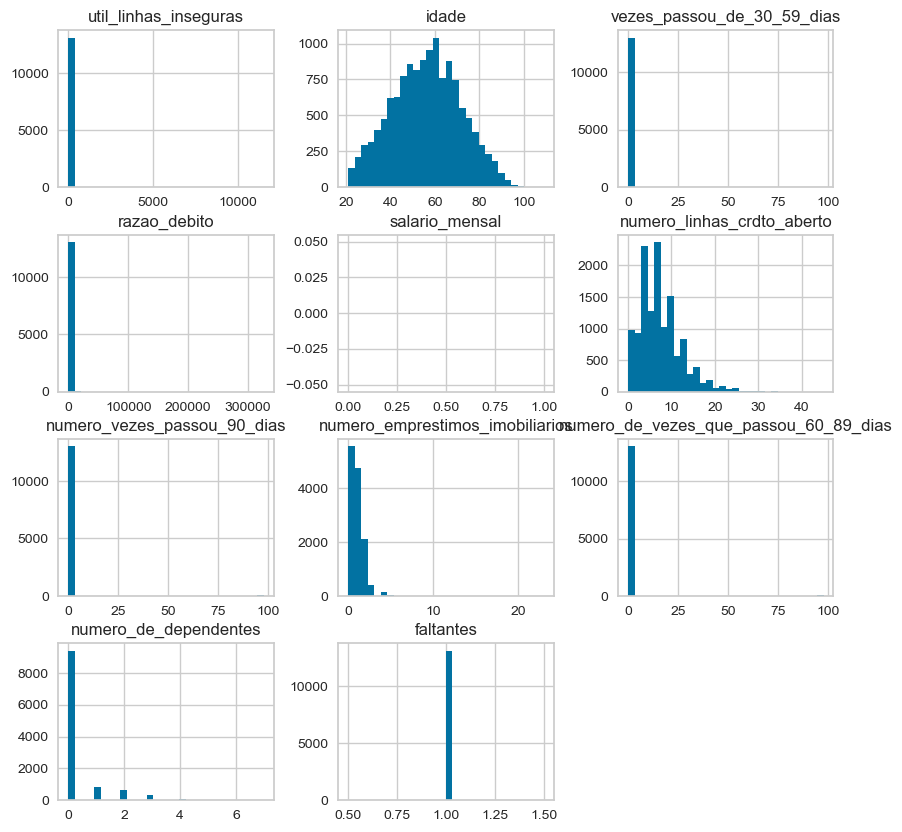

In [8]:
# Plota um histograma para as variáveis com valores faltantes
df_faltantes.query('faltantes == 1').hist(bins=30, figsize=(10, 10), layout=(4, 3));

Os histogramas e a matrix de nulidade indicam que não existe padrão aparente para os dados faltantes, logo podem ser imputados baseando-se nos demais dados.

In [9]:
# Importa o módulo necessário
from sklearn.impute import KNNImputer

# Inicializa o imputer KNN com 2 vizinhos
imputer = KNNImputer(n_neighbors=2)

# Imputa os valores faltantes nos conjuntos de treinamento e teste
X_full_train = pd.DataFrame(imputer.fit_transform(X_full_train), columns=list(X_full_train))
X_train = pd.DataFrame(imputer.fit_transform(X_train), columns=list(X_train))
X_val = pd.DataFrame(imputer.transform(X_val), columns=list(X_val))
X_test = pd.DataFrame(imputer.transform(X_test), columns=list(X_test))

### 3.2 Atributos com maioria dos valores igual a zero: descretização binária

In [120]:
# Define a função para transformar variáveis binárias em 0 e 1
def tranformar_vars_com_zero(df):

    variaveis_binarias = [
    'vezes_passou_de_30_59_dias',
    'numero_vezes_passou_90_dias',
    'numero_de_vezes_que_passou_60_89_dias',
    'numero_de_dependentes'
]
    df_bin = df.copy()

    for var in variaveis_binarias:
        # Aplica a transformação 1 se diferente de zero, 0 caso contrário
        df_bin[var] = df_bin[var].apply(lambda x: 1 if x != 0 else 0)

    return df_bin

# Lista das variáveis binárias a serem transformadas
variaveis_binarias = [
    'vezes_passou_de_30_59_dias',
    'numero_vezes_passou_90_dias',
    'numero_de_vezes_que_passou_60_89_dias',
    'numero_de_dependentes'
]

# Aplica a função de transformação em todos os conjuntos de dados
X_full_train = tranformar_vars_com_zero(X_full_train)
X_train = tranformar_vars_com_zero(X_train)
X_val = tranformar_vars_com_zero(X_val)
X_test = tranformar_vars_com_zero(X_test)

### 3.3 Variáveis em escalas diferentes

salario_mensal


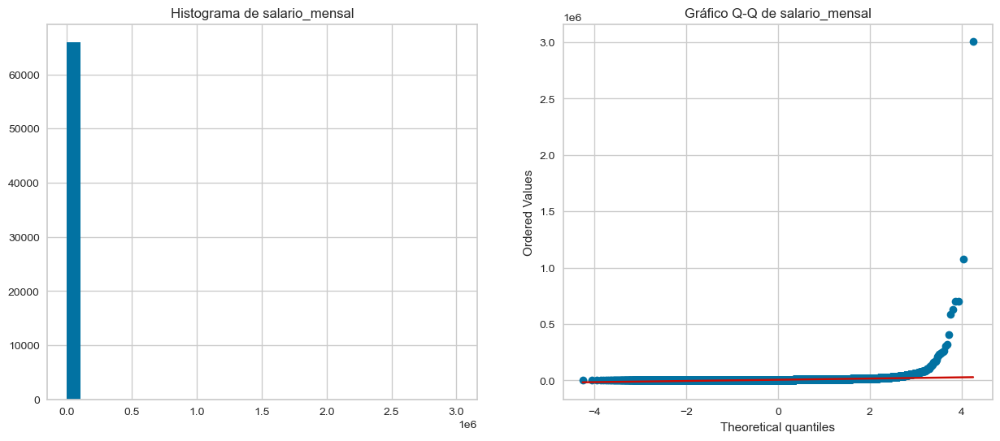

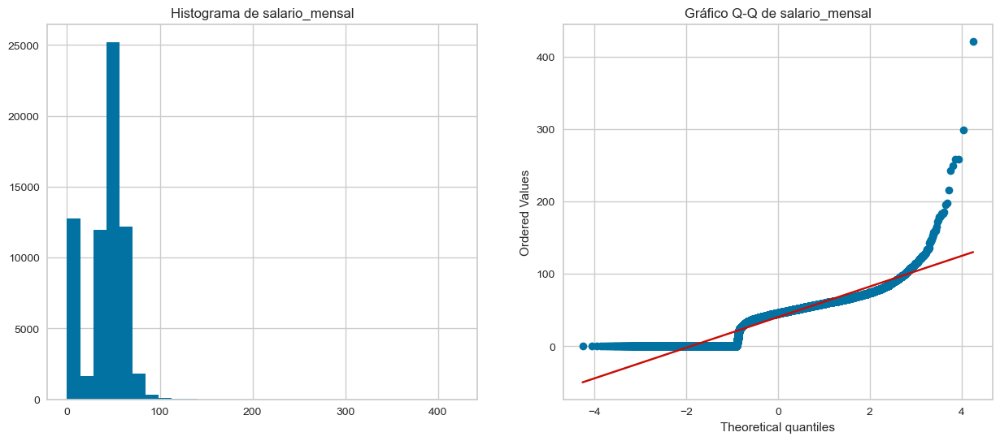


razao_debito


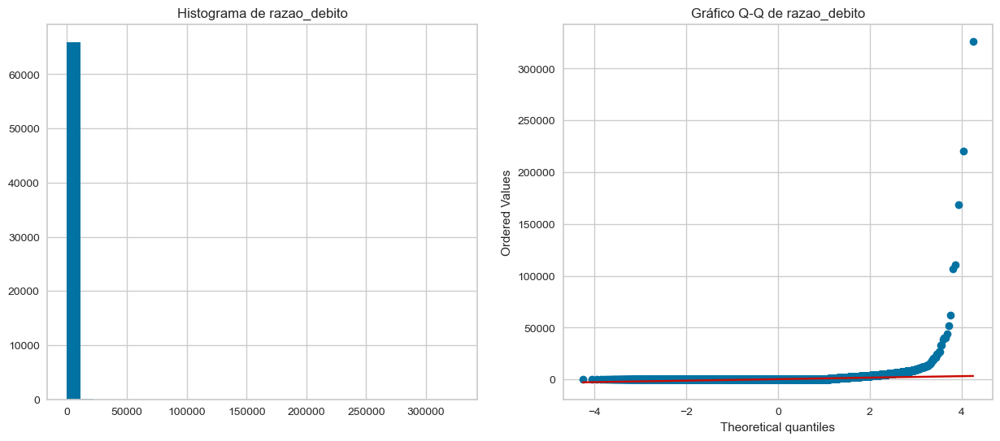

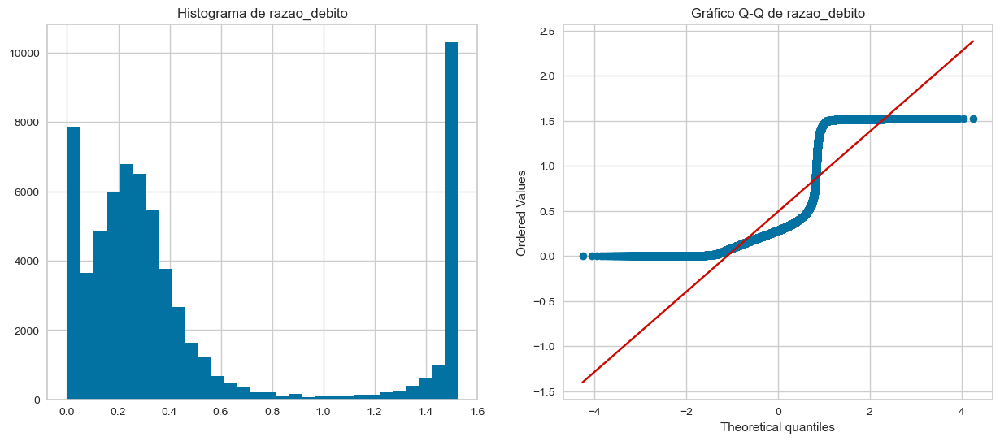


util_linhas_inseguras


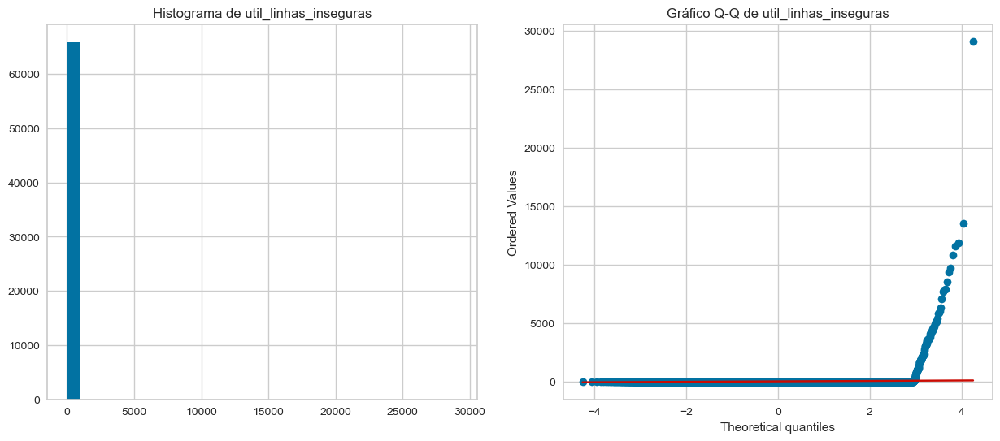

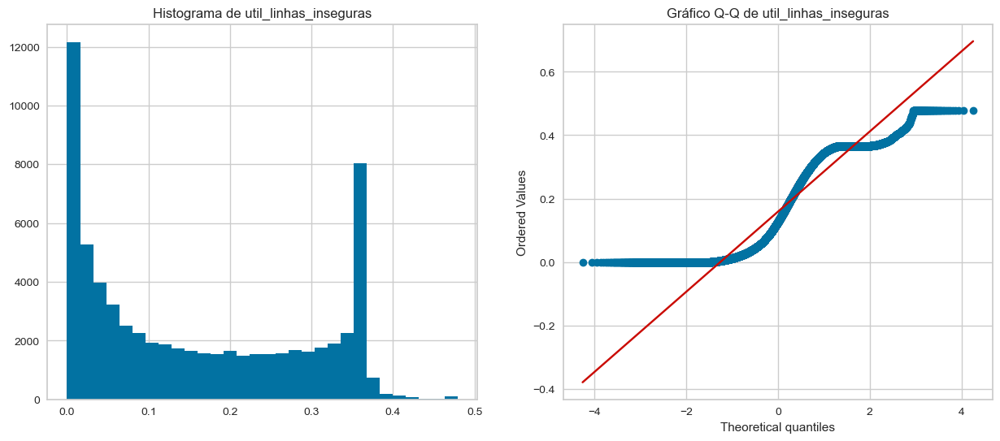

In [11]:
# Lista das variáveis que serão transformadas
variaveis_outras_escalas = [
    'razao_debito',
    'salario_mensal',
    'util_linhas_inseguras'
    ]

# Cria uma instância da classe YeoJohnsonTransformer com as variáveis escolhidas
yeo_transformer = YeoJohnsonTransformer(variables=variaveis_outras_escalas)

# Ajusta a transformação ao conjunto de treinamento
yeo_transformer.fit(X_train)

# Transforma as variáveis do conjunto de treinamento
X_train_tf = yeo_transformer.transform(X_train)

# Cria gráficos de histograma e Q-Q plot antes e depois da transformação para cada variável escolhida
print('salario_mensal')
diagnostic_plots(X_train,'salario_mensal')
diagnostic_plots(X_train_tf,'salario_mensal')

print('\nrazao_debito')
diagnostic_plots(X_train,'razao_debito')
diagnostic_plots(X_train_tf,'razao_debito')

print('\nutil_linhas_inseguras')
diagnostic_plots(X_train,'util_linhas_inseguras')
diagnostic_plots(X_train_tf,'util_linhas_inseguras')


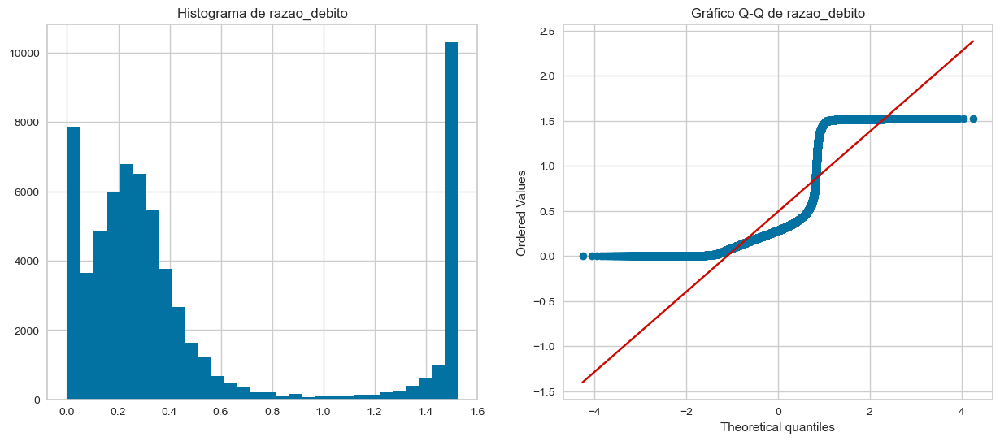

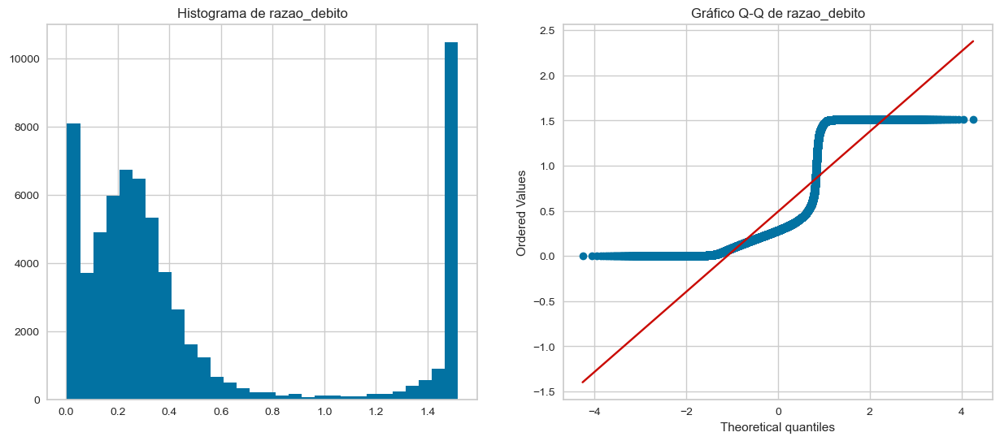

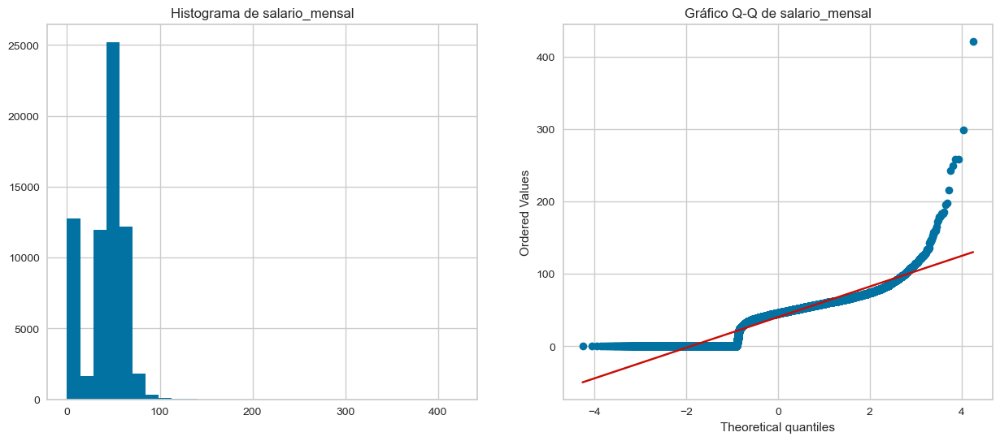

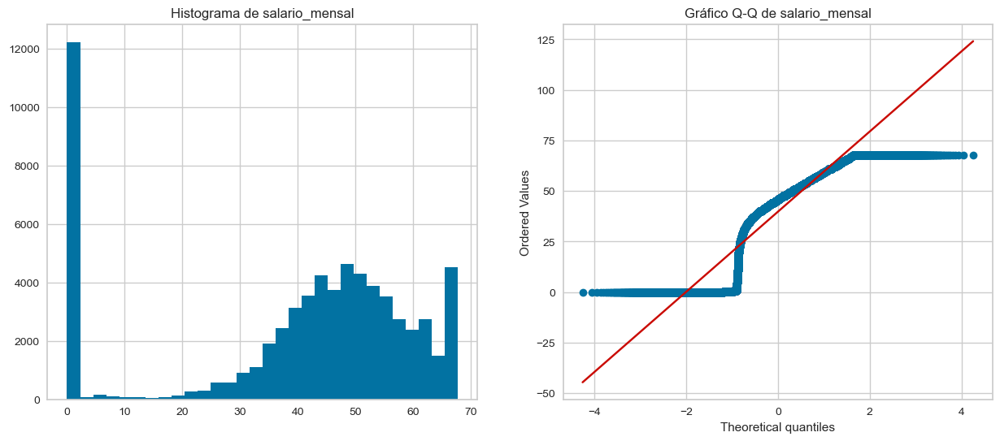

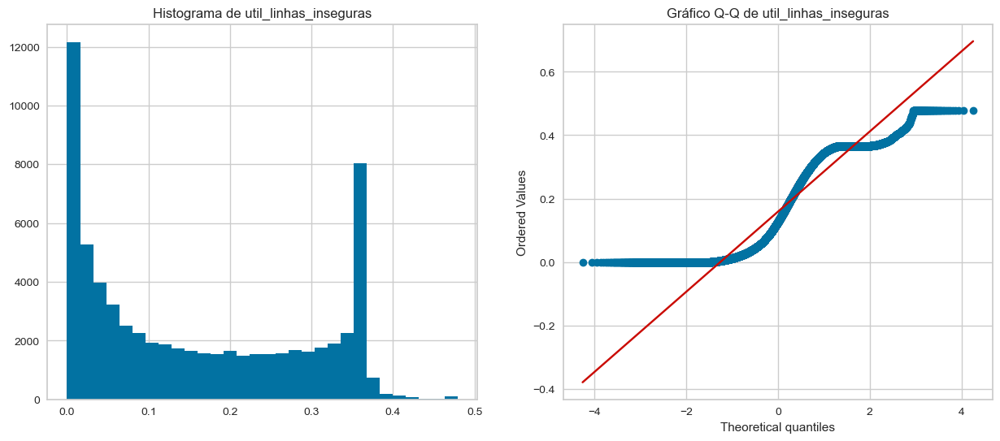

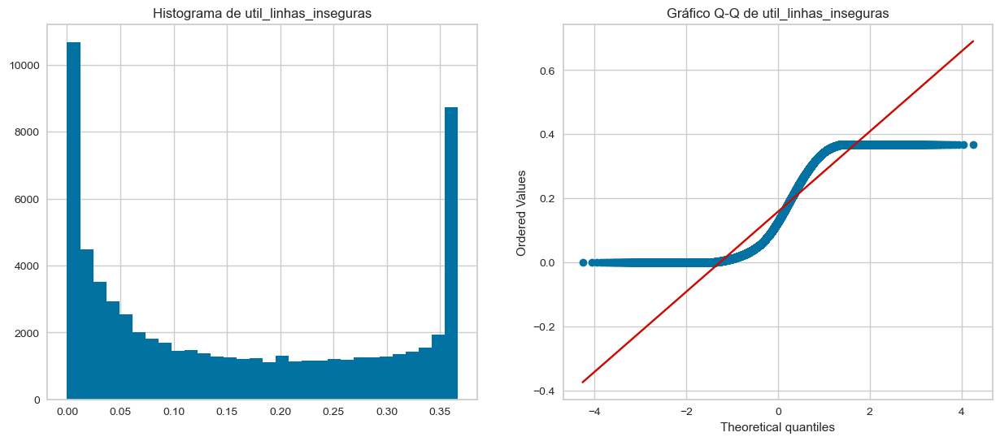

In [12]:
# Importar o módulo necessário
from feature_engine.outliers import Winsorizer

# Criar uma instância do Winsorizer para limitar os valores das variáveis ​​numéricas nos conjuntos de dados
capper = Winsorizer(
    variables=variaveis_outras_escalas,  # as variáveis para limitar
    capping_method="quantiles",  # definir o método de limitação
    tail="both",  # limitar tanto a cauda esquerda quanto a direita
    fold=0.05,  # definir a porcentagem das caudas a serem cortadas
)

# Ajustar o objeto de limitação aos dados de treinamento
capper.fit(X_train_tf)

# Aplicar a limitação aos dados de treinamento
X_train_winsor = capper.transform(X_train_tf)

# Criar gráficos de histograma e Q-Q plot para as variáveis ​​'razao_debito', 'salario_mensal' e 'util_linhas_inseguras' antes e depois da limitação
diagnostic_plots(X_train_tf, 'razao_debito')
diagnostic_plots(X_train_winsor, 'razao_debito')
diagnostic_plots(X_train_tf, 'salario_mensal')
diagnostic_plots(X_train_winsor, 'salario_mensal')
diagnostic_plots(X_train_tf,'util_linhas_inseguras')
diagnostic_plots(X_train_winsor,'util_linhas_inseguras')


df=       util_linhas_inseguras  idade  vezes_passou_de_30_59_dias  razao_debito  \
0                  -0.000000   55.0                           1      0.294327   
1                   0.094698   23.0                           0      0.782986   
2                   0.058036   64.0                           0      1.511922   
3                   0.026339   59.0                           0      0.074754   
4                   0.200021   32.0                           0      0.357402   
...                      ...    ...                         ...           ...   
87995               0.292681   55.0                           0      1.514393   
87996               0.069104   43.0                           0      1.515833   
87997               0.032387   47.0                           0      1.510142   
87998               0.338827   46.0                           0      0.155803   
87999               0.077578   34.0                           0      0.312814   

       salario_mensal  n

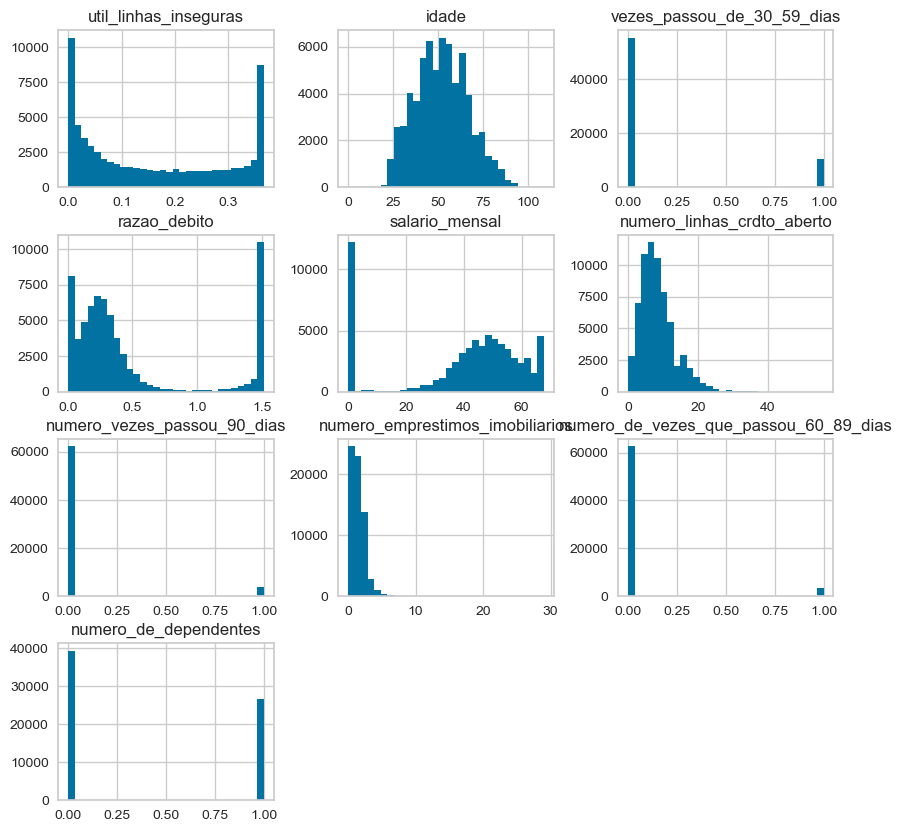

In [13]:
# Aplica a transformação Yeo-Johnson seguida do Winsorizer nas variáveis com outras escalas
X_full_train = capper.transform(yeo_transformer.transform(X_full_train))
X_train = capper.transform(yeo_transformer.transform(X_train))
X_val = capper.transform(yeo_transformer.transform(X_val))
X_test = capper.transform(yeo_transformer.transform(X_test))

# Imprime as dimensões dos dataframes
for df in [X_full_train, X_train, X_val, X_test]:
    print(f'{df=}:', df.shape)

# Plota histogramas das variáveis
X_train.hist(bins=30, figsize=(10, 10), layout=(4, 3));


### 3.4 Variáveis com outliers

In [14]:
# Lista de variáveis com possíveis outliers
variaveis_outliers = [    'numero_linhas_crdto_aberto',    'numero_emprestimos_imobiliarios']

# Plota um gráfico de boxplot para as variáveis selecionadas do dataframe X_train
X_train[variaveis_outliers].boxplot()

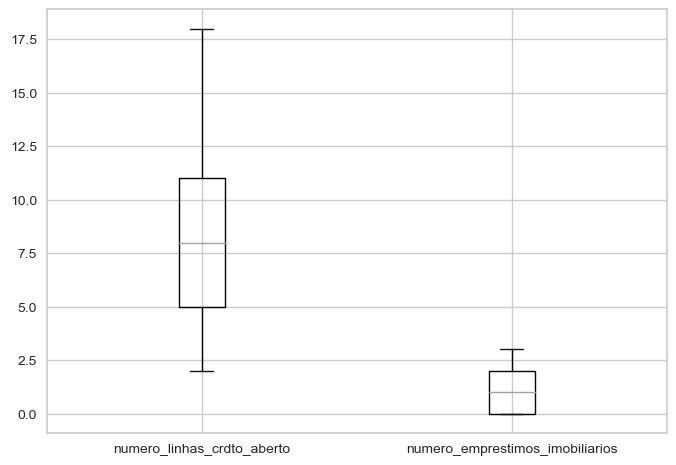

In [16]:
# Importando a classe Winsorizer do pacote feature_engine
from feature_engine.outliers import Winsorizer

# Criando um objeto Winsorizer com as configurações
capper2 = Winsorizer(
    variables=variaveis_outliers,
    capping_method="quantiles",
    tail="both",
    fold=0.05,
)

# Fazendo o ajuste do capper2 no dataframe X_train
capper2.fit(X_train)

# Aplicando a transformação do capper2 no dataframe X_train e armazenando na variável X_train_winsor2
X_train_winsor2 = capper2.transform(X_train)

# Plotando um gráfico de boxplot das variáveis selecionadas do dataframe X_train_winsor2 após a transformação
X_train_winsor2[variaveis_outliers].boxplot()

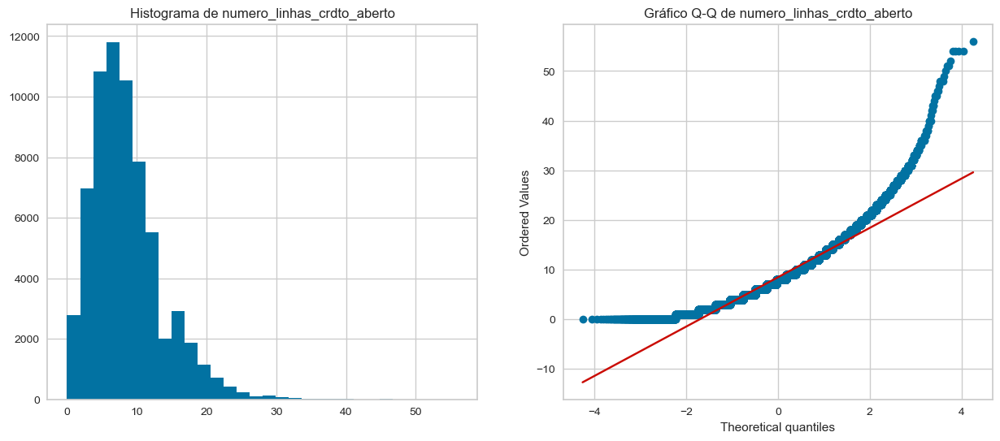

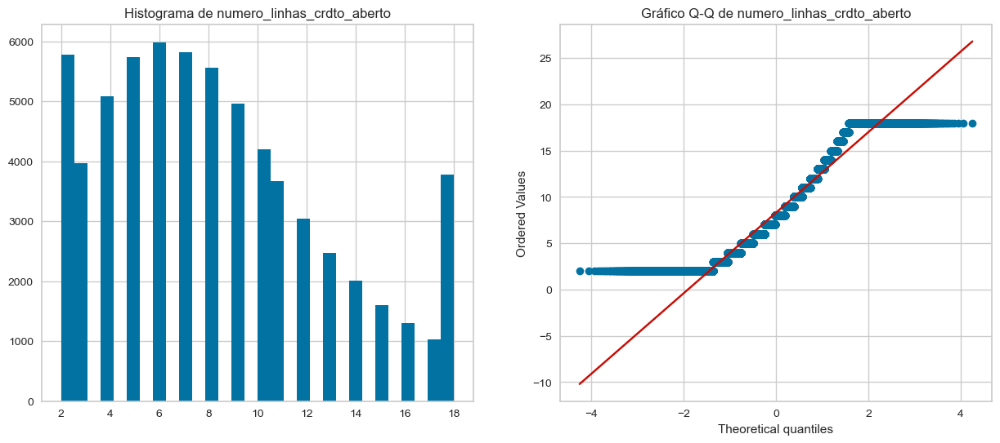

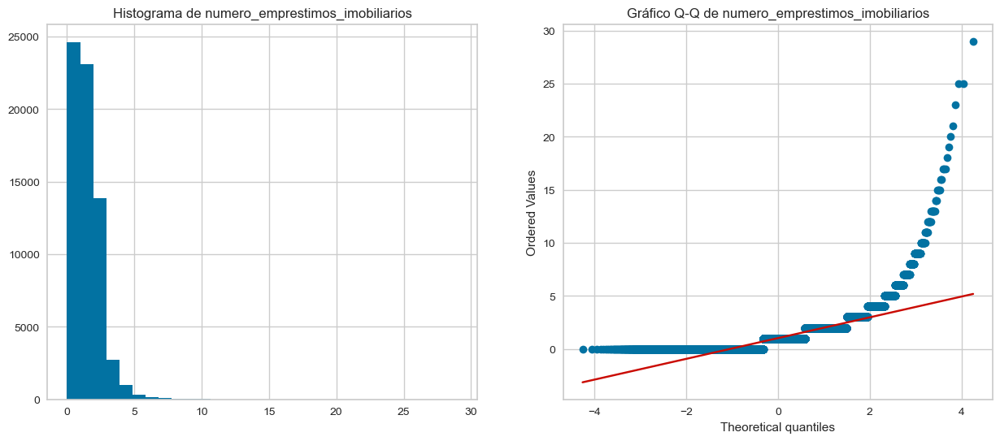

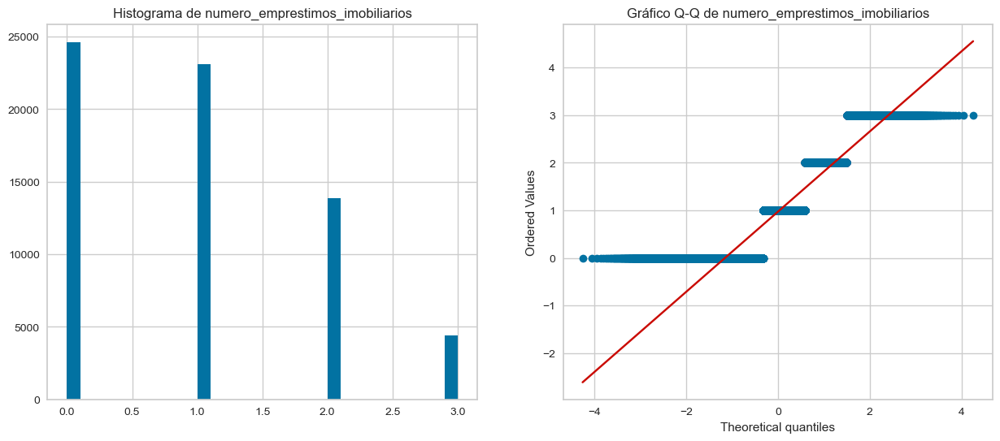

In [17]:
# Criar gráficos de histograma e Q-Q plot para as variáveis ​​'numero_linhas_crdto_aberto' e'numero_emprestimos_imobiliarios' antes e depois da limitação
diagnostic_plots(X_train, 'numero_linhas_crdto_aberto')
diagnostic_plots(X_train_winsor2, 'numero_linhas_crdto_aberto')
diagnostic_plots(X_train, 'numero_emprestimos_imobiliarios')
diagnostic_plots(X_train_winsor2, 'numero_emprestimos_imobiliarios')

In [18]:
X_full_train = capper2.fit_transform(X_full_train)
X_train = capper2.transform(X_train)
X_val = capper2.transform(X_val)
X_test = capper2.transform(X_test)

As transformações realizadas nesta seção foram:

Valores Ausentes:

- Identificação das variáveis com valores ausentes: 'salario_mensal' e 'numero_de_dependentes'.
- Criação de uma cópia de X_train para preencher os valores ausentes.
- Verificação de existência de padrão nos valores ausentes usando histograma e matriz nula.
- Como não havia padrão aparente, foi usada a imputação KNN para preencher os valores ausentes em todos os conjuntos.
- O novo conjunto de dados foi renomeado para X_full_train, X_train, X_val e X_test.

Variáveis Binárias:

- Identificação das variáveis com a maioria dos seus valores iguais a zero.
- Criação de uma função para transformar tais variáveis em formato binário, configurando valores diferentes de zero para um.
- Aplicação dessa transformação em X_full_train, X_train, X_val e X_test.
- Variáveis com Escalas Diferentes:

Identificação das variáveis com escalas diferentes.

- Uso da transformação Yeo-Johnson para transformar as variáveis em distribuição normal.
- Uso de gráficos diagnósticos para confirmar a transformação.
- Aplicação da técnica Winsorização para limitar os outliers e garantir que a nova distribuição não seja afetada por eles.
- Uso da discretização por frequência igual para discretizar as variáveis contínuas em 20 intervalos igualmente dimensionados.
- Aplicação das técnicas de transformação Yeo-Johnson e Winsorização em X_full_train, X_train, X_val e X_test.
- Uso da discretização por frequência igual para discretizar as variáveis contínuas em 20 intervalos igualmente dimensionados em X_train, X_val e X_test.

Variáveis com Outliers:

- Identificação das variáveis com outliers usando o método IQR.
- Criação de uma função para transformar as variáveis com outliers usando os quantis superior e inferior dos dados.
- Aplicação dessa transformação em X_full_train, X_train, X_val e X_test.

Os conjuntos finais de dados, X_full_train, X_train, X_val e X_test, estão agora prontos para serem utilizados na modelagem, permitindo a construção dos modelos preditivos.

## 4. Modelagem

Nesta seção, serão testados e otimizados três modelos (LightGBM, XGboost e Adaboost) em cada uma das quatro estratégias de amostragem (Sem sampling, Undersampling com NearMiss, Oversampling com SMOTE e Over e Undersampling com SMOTEENN) usando a biblioteca Optuna. O desempenho dos modelos será avaliado em termos de Fbeta score com beta=2 para o recall, que é uma métrica adequada para lidar com desequilíbrios de classe. Além disso, as métricas PR AUC e ROC AUC serão utilizadas para avaliar o desempenho do modelo, bem como as curvas de aprendizado e as matrizes de confusão.

Para cada estratégia de amostragem, a biblioteca Optuna será usada para otimizar hiperparâmetros dos modelos LightGBM, XGboost e Adaboost. Esses modelos serão treinados e testados com os dados de treinamento e teste para cada estratégia de amostragem. As métricas PR AUC e ROC AUC serão calculadas para avaliar o desempenho do modelo em cada estratégia de amostragem. A curva de aprendizado será plotada para cada modelo em cada estratégia de amostragem.

Além disso, as matrizes de confusão serão utilizadas para avaliar o desempenho do modelo em cada estratégia de amostragem, a fim de entender melhor as áreas em que os modelos podem estar errando. Por fim, os resultados serão comparados para determinar qual modelo e qual estratégia de amostragem tiveram o melhor desempenho no conjunto de dados em questão.

In [137]:
X_full_train, y_full_train, X_test, y_test, _, _, _, _ = split_data(treino, 24)

Treino: 66000 Validação: 22000 Teste: 22000


In [148]:
from sklearn.metrics import average_precision_score
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Binarizer

def preprocess(X):
    preprocess = ColumnTransformer(
        [('imputing', KNNImputer(n_neighbors=2), variaveis_com_faltantes),
        #('discret', Binarizer(), variaveis_binarias),
        ('normal', YeoJohnsonTransformer(), variaveis_outras_escalas),
        ('cap_norm',  Winsorizer( capping_method="quantiles", tail="both", fold=0.05), variaveis_outras_escalas),
        ('cap_outliers', Winsorizer( capping_method="quantiles", tail="both", fold=0.05), variaveis_outliers),
    ])
    return preprocess.fit_transform(X)

X = preprocess(X_full_train)

ValueError: Some of the variables to transform contain NaN. Check and remove those before using this transformer.

### 4.1 Sem sampling 

- Nesta subseção, não é aplicada nenhuma técnica de amostragem nos dados.
- Em vez disso, é ajustado um modelo de regressão logística com pesos diferentes para cada classe.
- O objetivo é avaliar o desempenho do modelo sem qualquer ajuste para a desproporção de classes.

In [25]:
# Define a métrica de avaliação como F2 score
f2_score = make_scorer(fbeta_score, beta=2)

# Define a função objetivo a ser minimizada pelo Optuna
def objective(trial):
     # Define hiperparâmetros a serem ajustados para o modelo
    model_name = trial.suggest_categorical('model', ['lgbm', 'xgb', 'adaboost'])

    if model_name == 'lgbm':
        params = {
            'num_leaves': trial.suggest_int('num_leaves', 2, 128),
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
        }
        model = LGBMClassifier(**params, is_unbalance=True)

    elif model_name == 'xgb':
        params = {
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'gamma': trial.suggest_loguniform('gamma', 0.001, 10.0),
            'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 10.0),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        }
        model = XGBClassifier(**params,  scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum())

    else:
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1)
        }
        model = AdaBoostClassifier(**params)

    model.fit(X_train, y_train)

    # Use cross_val_score para calcular o F2 score no conjunto de validação
    scores = cross_val_score(model, X_full_train, y_full_train, cv=StratifiedKFold(), scoring=f2_score)

    # Retorna a pontuação média
    return scores.mean()

# Execute o Optuna para encontrar os melhores hiperparâmetros para os três modelos
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=100, n_jobs=-1)


[I 2023-02-18 05:16:44,836] A new study created in memory with name: no-name-84c6679a-0300-420d-a802-3ad38226aef7
[I 2023-02-18 05:17:10,225] Trial 3 finished with value: 0.0 and parameters: {'model': 'adaboost', 'n_estimators': 69, 'learning_rate': 0.01425361522264919}. Best is trial 3 with value: 0.0.
[I 2023-02-18 05:17:36,913] Trial 0 finished with value: 0.27345147987695234 and parameters: {'model': 'lgbm', 'num_leaves': 83, 'max_depth': 13, 'learning_rate': 0.007417828992687577, 'min_child_samples': 97, 'subsample': 0.9800978727795296, 'colsample_bytree': 0.7406357044934659, 'reg_alpha': 0.21874389657864884, 'reg_lambda': 0.15302452817842438}. Best is trial 0 with value: 0.27345147987695234.
[I 2023-02-18 05:18:01,897] Trial 5 finished with value: 0.0 and parameters: {'model': 'lgbm', 'num_leaves': 78, 'max_depth': 6, 'learning_rate': 0.0025025491686924426, 'min_child_samples': 15, 'subsample': 0.505445018302099, 'colsample_bytree': 0.8280631267487979, 'reg_alpha': 1.971078841308

lgbm
PR AUC: 0.372
ROC AUC: 0.860
xgb
PR AUC: 0.370
ROC AUC: 0.858
adaboost
PR AUC: 0.360
ROC AUC: 0.854


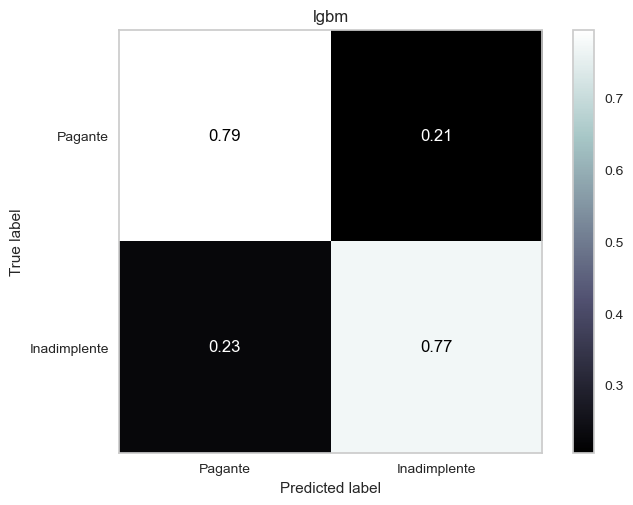

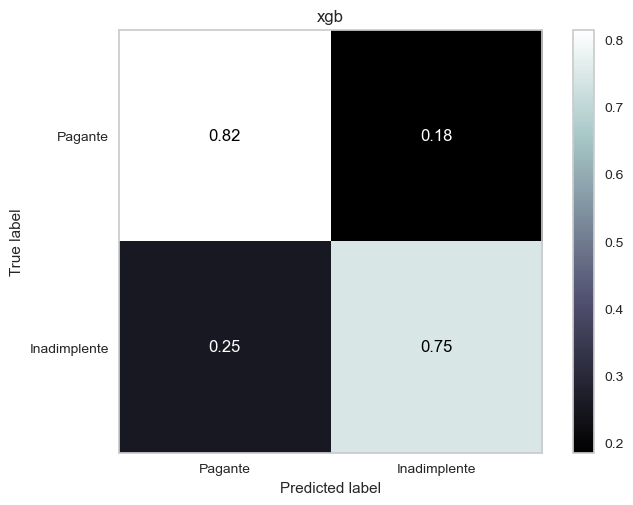

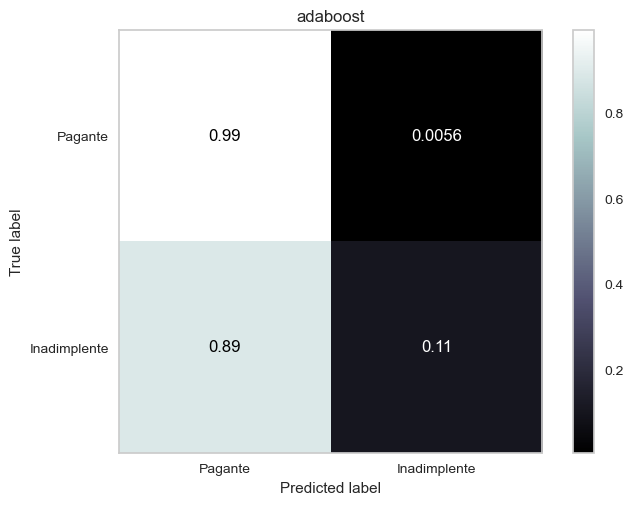

In [26]:
# Criar um dicionário com os melhores modelos para cada algoritmo
best_models = {}

for trial in study.trials:
    model_name = trial.params['model']
    score = trial.value
    params = trial.params
    if model_name not in best_models or score > best_models[model_name]['score']:
        del params['model']
        best_models[model_name] = {'score': score, 'params': params}

# Instanciar o melhor modelo para cada algoritmo com os seus respectivos melhores parâmetros
best_lgbm_model = LGBMClassifier(**best_models['lgbm']['params'], is_unbalance=True)
best_xgb_model = XGBClassifier(**best_models['xgb']['params'], scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum())
best_adaboost_model = AdaBoostClassifier(**best_models['adaboost']['params'])

# Criar um dicionário com os modelos finais
final_models = {
    'lgbm': best_lgbm_model,
    'xgb': best_xgb_model,
    'adaboost': best_adaboost_model,
}

# Treinar os modelos finais no conjunto completo de treinamento e fazer previsões no conjunto de teste
test_preds = {}
for model_name, model in final_models.items():
    # Treinar o modelo no conjunto de treinamento completo
    model.fit(X_full_train, y_full_train)

    # Fazer previsões para o conjunto de teste
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:,1]

    # Calcular as métricas PR AUC e ROC AUC
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    auc_score = auc(recall, precision)
    print(model_name)
    print('PR AUC: %.3f' % auc_score)
    print('ROC AUC: %.3f' % roc_auc)

    # Plotar a matriz de confusão normalizada para o conjunto de teste
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
    plt.title(model_name)
    plt.grid(False)


In [27]:
# Faça um loop através do dicionário best_models e plote os relatórios de classificação desbalanceada da bibliotrca imblearn
for nome, modelo in final_models.items():
    # Fit do pipeline no conjunto de treinamento completo
    modelo.fit(X_full_train, y_full_train)

    # Predição da variável-alvo no conjunto de teste
    y_pred = modelo.predict(X_test)

    # Imprimir o relatório de classificação
    print(nome)
    print(classification_report_imbalanced(y_test,y_pred))


lgbm
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.79      0.77      0.88      0.78      0.62     20534
          1       0.21      0.77      0.79      0.33      0.78      0.61      1466

avg / total       0.93      0.79      0.77      0.84      0.78      0.62     22000

xgb
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.82      0.75      0.89      0.78      0.61     20534
          1       0.22      0.75      0.82      0.34      0.78      0.60      1466

avg / total       0.93      0.81      0.75      0.85      0.78      0.61     22000

adaboost
                   pre       rec       spe        f1       geo       iba       sup

          0       0.94      0.99      0.11      0.97      0.33      0.12     20534
          1       0.58      0.11      0.99      0.18      0.33      0.10      1466

avg / total       0.92      0.94      0.17      0.91      0.3

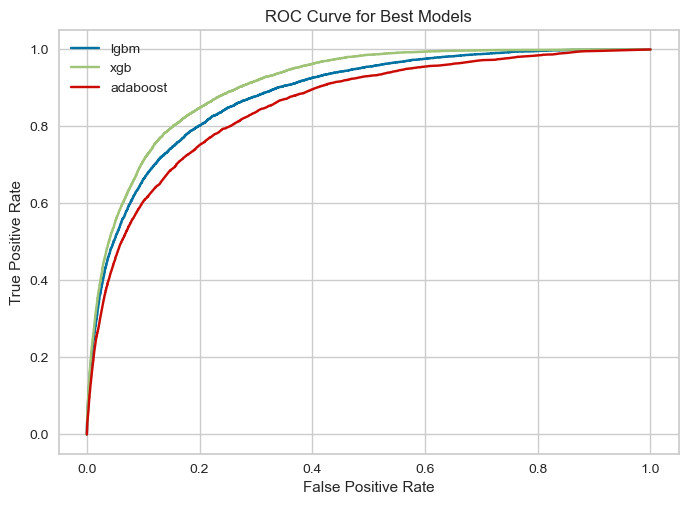

In [28]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_roc_curve(model.fit(X_full_train, y_full_train), X_full_train, y_full_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva ROC para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

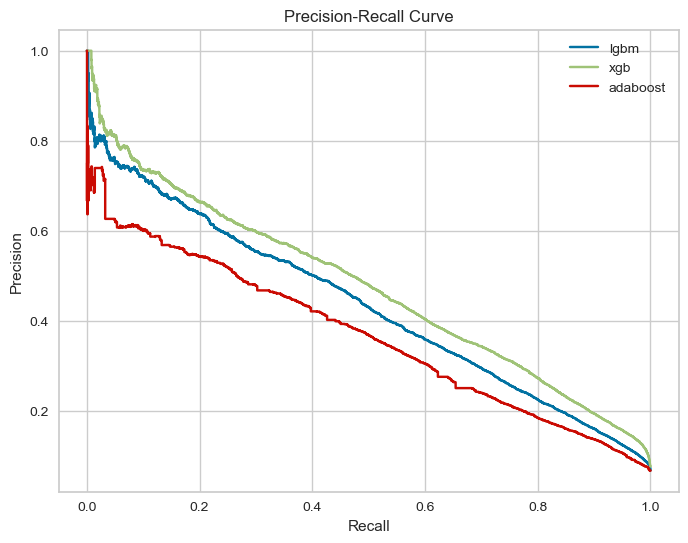

In [29]:
import matplotlib.pyplot as plt

from sklearn.metrics import plot_precision_recall_curve

# plot precision-recall curves for all models
fig, ax = plt.subplots(figsize=(8, 6))
for model_name, model in final_models.items():
    plot_precision_recall_curve(model.fit(X_full_train, y_full_train), X_full_train, y_full_train, ax=ax, label=model_name)

# set plot title and labels
ax.set_title('Precision-Recall Curve')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()

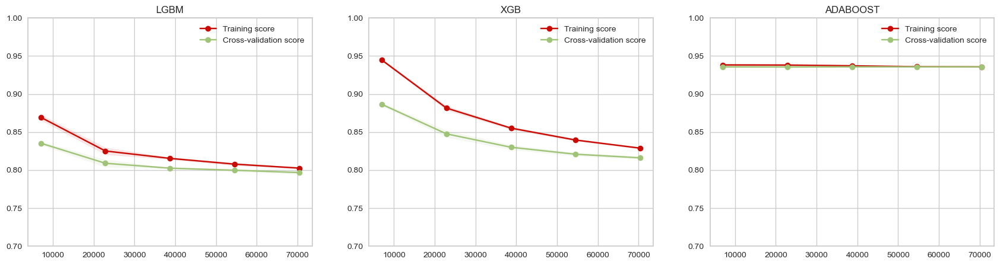

In [30]:
# Define uma função que plota múltiplas curvas de aprendizado para diferentes modelos de machine learning
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    # Cria uma figura com subplots para cada modelo
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):
        # Cria uma curva de aprendizado para o modelo atual
        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='accuracy')

        # Calcula as médias e desvios padrão dos scores de treino e validação para cada tamanho de conjunto de treinamento
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        # Preenche a área entre as barras de erro das curvas de treino e validação com cores diferentes
        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        # Plota as curvas de treino e validação
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        # Adiciona legenda, título e configurações adicionais para cada subplot
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.7, 1)
        axes[i].grid()
        
    # Mostra o gráfico final
    plt.show()

# Chama a função para plotar curvas de aprendizado para os modelos finais, usando o conjunto de treinamento completo
plot_multiple_learning_curves(final_models, X_full_train, y_full_train)


In [34]:
# Este loop salva cada modelo em um arquivo pickle com um timestamp no nome do arquivo
for name, model in best_models.items():
    now = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M')
    with open(f'models/optuna_imbalanced_{name}_{now}.pkl', 'wb') as file:
        pickle.dump(model, file

### 4.2 Undersampling

- Nesta subseção, é aplicada a técnica de undersampling utilizando o algoritmo NearMiss.
- O objetivo é reduzir o número de instâncias da classe majoritária para que a proporção de classes seja mais equilibrada.
- O modelo de regressão logística é ajustado nos dados reduzidos pelo NearMiss, e seu desempenho é avaliado.

In [ ]:
# Importa a classe NearMiss do módulo imblearn.under_sampling
from imblearn.under_sampling import NearMiss

# Instancia o objeto NearMiss
nm = NearMiss()

# Aplica o método fit_resample para balancear os conjuntos de treino e de teste utilizando NearMiss
# e armazena os dados balanceados em novas variáveis
nm.fit_resample(X_train, y_train)
under_X_full_train, under_y_full_train = nm.fit_resample(X_full_train, y_full_train)
under_X_train, under_y_train = nm.fit_resample(X_train, y_train)

In [36]:
# Define evaluation metric as F2 score
f2_score = make_scorer(fbeta_score, beta=2)

# Define objective function to be minimized by Optuna
def objective(trial):
     # Define hyperparameters to be tuned for the model
    model_name = trial.suggest_categorical('model', ['lgbm', 'xgb', 'adaboost'])

    if model_name == 'lgbm':
        params = {
            'num_leaves': trial.suggest_int('num_leaves', 2, 128),
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
        }
        model = LGBMClassifier(**params, is_unbalance=True)

    elif model_name == 'xgb':
        params = {
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'gamma': trial.suggest_loguniform('gamma', 0.001, 10.0),
            'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 10.0),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        }
        model = XGBClassifier(**params,  scale_pos_weight = (under_y_train == 0).sum() / (y_train == 1).sum())

    else:
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1)
        }
        model = AdaBoostClassifier(**params)

    model.fit(under_X_train, under_y_train)

    # Use cross_val_score to calculate the F2 score on the validation set

    # define pipeline
    steps = [('under', NearMiss()), ('model',model)]
    pipeline = Pipeline(steps=steps)

    # evaluate pipeline
    scores = cross_val_score(model, under_X_full_train, under_y_full_train, cv=StratifiedKFold(), scoring=f2_score)

    # Return the mean score
    return scores.mean()

# Run Optuna to find the best hyperparameters for the three models
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=100, n_jobs=-1)

[I 2023-02-18 09:59:14,958] A new study created in memory with name: no-name-bffa36cf-bde3-43e4-9428-d52336c1acdd
[I 2023-02-18 09:59:20,602] Trial 2 finished with value: 0.8372855351744641 and parameters: {'model': 'lgbm', 'num_leaves': 115, 'max_depth': 4, 'learning_rate': 0.03377080565638586, 'min_child_samples': 61, 'subsample': 0.7093466496818455, 'colsample_bytree': 0.6231208011749158, 'reg_alpha': 0.19634569983738848, 'reg_lambda': 0.10964323149562129}. Best is trial 2 with value: 0.8372855351744641.
[I 2023-02-18 09:59:32,034] Trial 4 finished with value: 0.8397672668216206 and parameters: {'model': 'xgb', 'max_depth': 7, 'learning_rate': 0.0020537754131835706, 'gamma': 0.04726608109487859, 'min_child_weight': 2.518837378861134, 'subsample': 0.6082084289801422, 'colsample_bytree': 0.7432963084224471, 'reg_alpha': 0.03747840821777146, 'reg_lambda': 2.6715355022052636, 'n_estimators': 119}. Best is trial 4 with value: 0.8397672668216206.
[I 2023-02-18 09:59:33,764] Trial 0 finish

lgbm
PR AUC: 0.151
ROC AUC: 0.709
xgb
PR AUC: 0.171
ROC AUC: 0.714
adaboost
PR AUC: 0.277
ROC AUC: 0.795


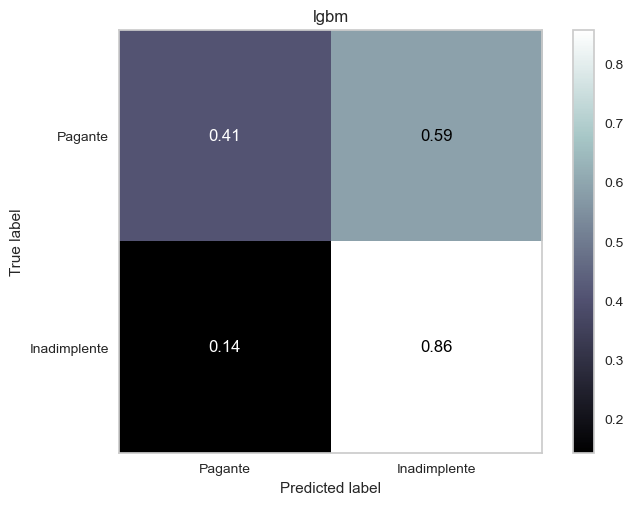

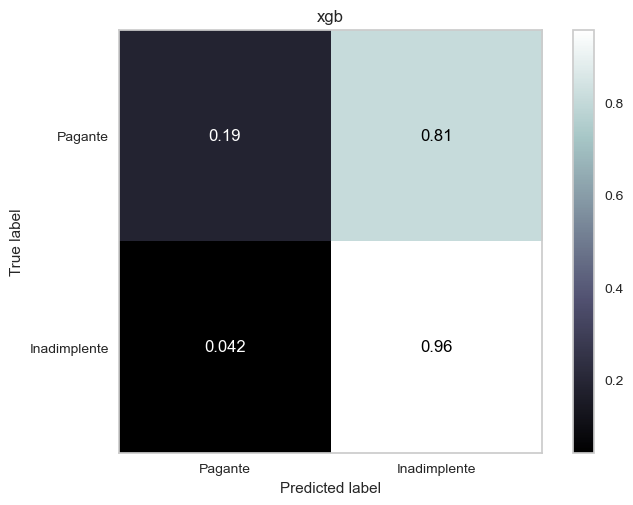

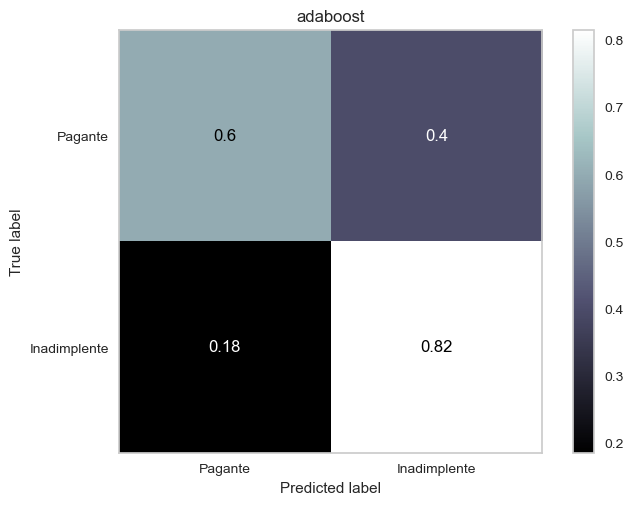

In [37]:
# Create a dictionary of the best models for each algorithm
best_models = {}

for trial in study.trials:
    model_name = trial.params['model']
    score = trial.value
    params = trial.params
    if model_name not in best_models or score > best_models[model_name]['score']:
        del params['model']
        best_models[model_name] = {'score': score, 'params': params}
        

best_lgbm_model = LGBMClassifier(**best_models['lgbm']['params'], is_unbalance=True)
best_xgb_model = XGBClassifier(**best_models['xgb']['params'], scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum())
best_adaboost_model = AdaBoostClassifier(**best_models['adaboost']['params'])

final_models = {
    'lgbm': best_lgbm_model,
    'xgb': best_xgb_model,
    'adaboost': best_adaboost_model,
    }

# Fit the best models on the entire training set and make predictions on the test set
test_preds = {}
for model_name, model in final_models.items():
    # Fit the pipeline on the training set
    model.fit(under_X_full_train, under_y_full_train)

    # Predict the target variable on the testing set
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:,1]

    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    auc_score = auc(recall, precision)
    print(model_name)
    print('PR AUC: %.3f' % auc_score)
    print('ROC AUC: %.3f' % roc_auc)

    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
    plt.title(model_name)
    plt.grid(False)

In [38]:
# Loop through the best_models dictionary and plot the ROC curves
for name, model in final_models.items():
    # Fit the pipeline on the training set
    model.fit(under_X_full_train, under_y_full_train)

    # Predict the target variable on the testing set
    y_pred = model.predict(X_test)

    # Print the classification report
    print(name)
    print(classification_report_imbalanced(y_test,y_pred))

lgbm
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.41      0.86      0.58      0.59      0.34     20534
          1       0.09      0.86      0.41      0.17      0.59      0.37      1466

avg / total       0.92      0.44      0.83      0.55      0.59      0.34     22000

xgb
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.19      0.96      0.32      0.43      0.17     20534
          1       0.08      0.96      0.19      0.14      0.43      0.19      1466

avg / total       0.92      0.24      0.91      0.30      0.43      0.17     22000

adaboost
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.60      0.82      0.74      0.70      0.48     20534
          1       0.13      0.82      0.60      0.22      0.70      0.50      1466

avg / total       0.92      0.61      0.80      0.71      0.7

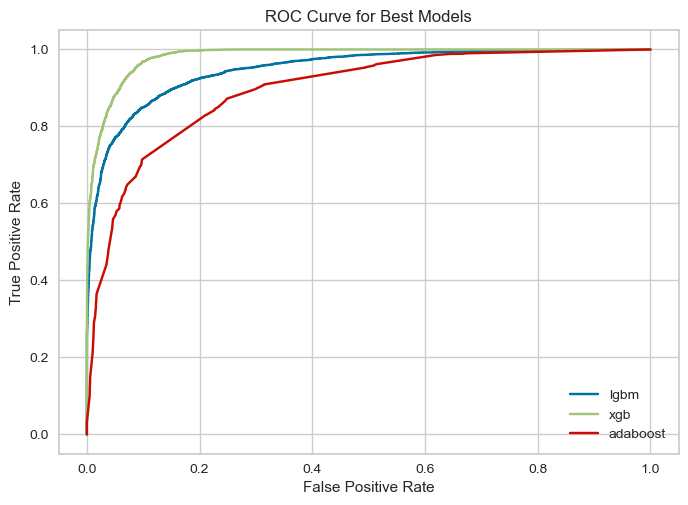

In [39]:
# Create a figure and axes for the plot
fig, ax = plt.subplots()

# Loop through the best_models dictionary and plot the ROC curves
for name, model in final_models.items():
    plot_roc_curve(model.fit(under_X_full_train, under_y_full_train), under_X_full_train, under_y_full_train, ax=ax, label=name)

# Set the title, xlabel, and ylabel
ax.set_title('ROC Curve for Best Models')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()

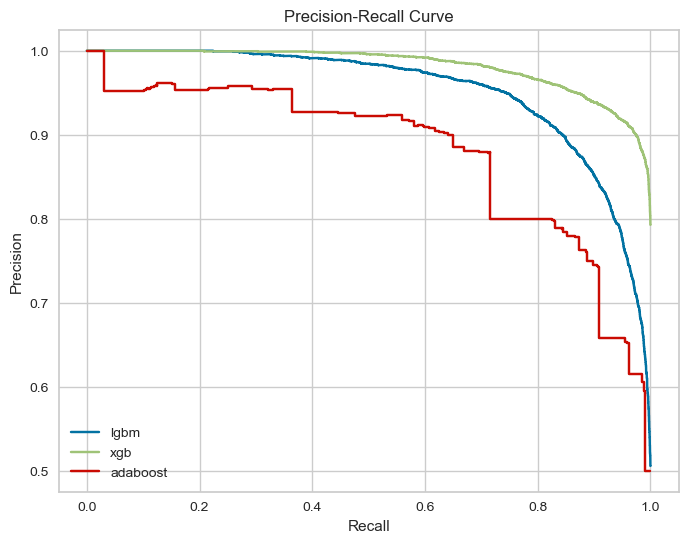

In [40]:
# plot precision-recall curves for all models
fig, ax = plt.subplots(figsize=(8, 6))
for model_name, model in final_models.items():
    plot_precision_recall_curve(model.fit(under_X_full_train, under_y_full_train), under_X_full_train, under_y_full_train, ax=ax, label=model_name)

# set plot title and labels
ax.set_title('Precision-Recall Curve')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()

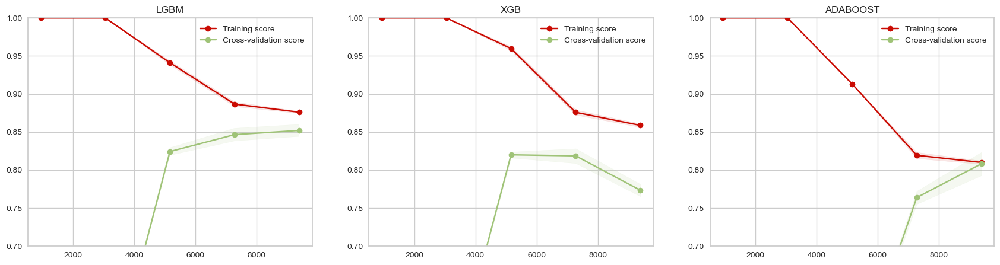

In [41]:
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):

        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='accuracy')

        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.7, 1)
        axes[i].grid()
        
    plt.show()

plot_multiple_learning_curves(final_models, under_X_full_train, under_y_full_train)

In [42]:
# Este loop salva cada modelo em um arquivo pickle com um timestamp no nome do arquivo
for name, model in best_models.items():
    now = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M')
    with open(f'models/optuna_under_{name}_{now}.pkl', 'wb') as file:
        pickle.dump(model, file)

### 4.3 Oversampling

- Nesta subseção, é aplicada a técnica de oversampling utilizando o algoritmo SMOTE (Synthetic Minority Over-sampling Technique).
- O objetivo é gerar novas instâncias sintéticas da classe minoritária para aumentar sua representação nos dados.
- O modelo de regressão logística é ajustado nos dados aumentados pelo SMOTE, e seu desempenho é avaliado.

In [ ]:
# Importar a classe SMOTE do módulo imblearn
from imblearn.over_sampling import SMOTE

# Instanciar o objeto SMOTE
sm = SMOTE(random_state=42)

# Aplicar o método fit_resample na amostra completa de treino e obter as novas amostras
over_X_full_train, over_y_full_train = sm.fit_resample(X_full_train, y_full_train)
over_X_train, over_y_train = sm.fit_resample(X_train, y_train)

In [43]:
# Define evaluation metric as F2 score
f2_score = make_scorer(fbeta_score, beta=2)

# Define objective function to be minimized by Optuna
def objective(trial):
     # Define hyperparameters to be tuned for the model
    model_name = trial.suggest_categorical('model', ['lgbm', 'xgb', 'adaboost'])

    if model_name == 'lgbm':
        params = {
            'num_leaves': trial.suggest_int('num_leaves', 2, 128),
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
        }
        model = LGBMClassifier(**params, is_unbalance=True)

    elif model_name == 'xgb':
        params = {
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'gamma': trial.suggest_loguniform('gamma', 0.001, 10.0),
            'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 10.0),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        }
        model = XGBClassifier(**params,  scale_pos_weight = (over_y_train == 0).sum() / (over_y_train == 1).sum())

    else:
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1)
        }
        model = AdaBoostClassifier(**params)

    model.fit(over_X_train, over_y_train)

    # Use cross_val_score to calculate the F2 score on the validation set
    scores = cross_val_score(model, over_X_full_train, over_y_full_train, cv=StratifiedKFold(), scoring=f2_score)

    # Return the mean score
    return scores.mean()

# Run Optuna to find the best hyperparameters for the three models
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=100, n_jobs=-1)

[I 2023-02-18 10:13:03,832] A new study created in memory with name: no-name-1aae6938-84b0-4595-b8f9-d6133f17f906
[I 2023-02-18 10:15:48,764] Trial 3 finished with value: 0.8006849301908083 and parameters: {'model': 'adaboost', 'n_estimators': 171, 'learning_rate': 0.0026050581872869875}. Best is trial 3 with value: 0.8006849301908083.
[I 2023-02-18 10:17:35,794] Trial 4 finished with value: 0.8009452740107548 and parameters: {'model': 'adaboost', 'n_estimators': 113, 'learning_rate': 0.0033499427308718915}. Best is trial 4 with value: 0.8009452740107548.
[I 2023-02-18 10:17:41,898] Trial 2 finished with value: 0.7846796641810292 and parameters: {'model': 'adaboost', 'n_estimators': 292, 'learning_rate': 0.004074119047253246}. Best is trial 4 with value: 0.8009452740107548.
[I 2023-02-18 10:18:29,202] Trial 5 finished with value: 0.8238201989845246 and parameters: {'model': 'lgbm', 'num_leaves': 10, 'max_depth': 6, 'learning_rate': 0.031949084195890105, 'min_child_samples': 97, 'subsam

lgbm
PR AUC: 0.296
ROC AUC: 0.836
xgb
PR AUC: 0.265
ROC AUC: 0.807
adaboost
PR AUC: 0.299
ROC AUC: 0.824


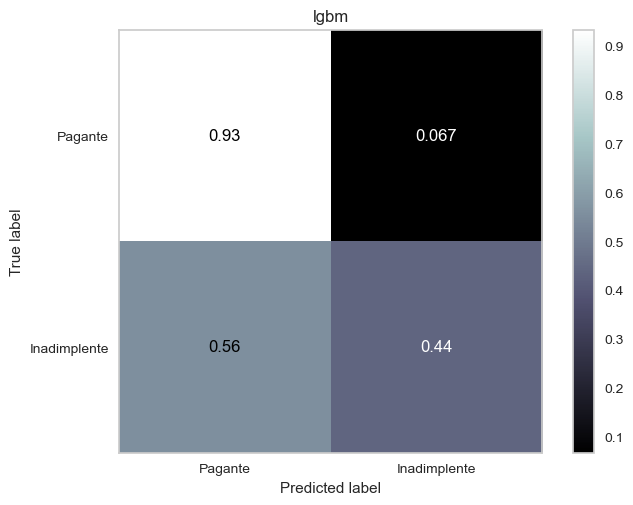

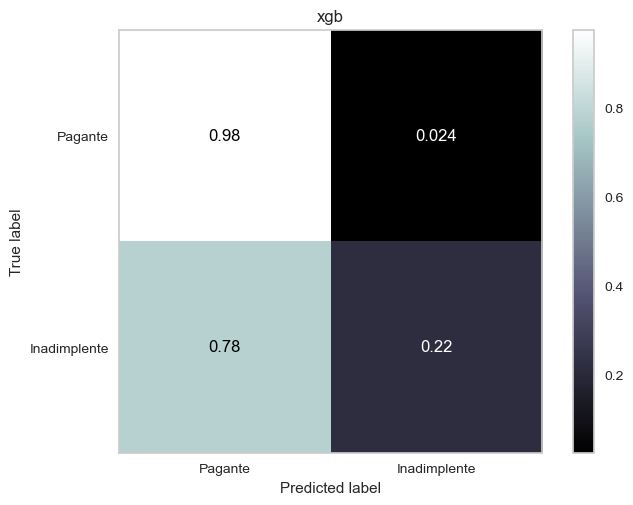

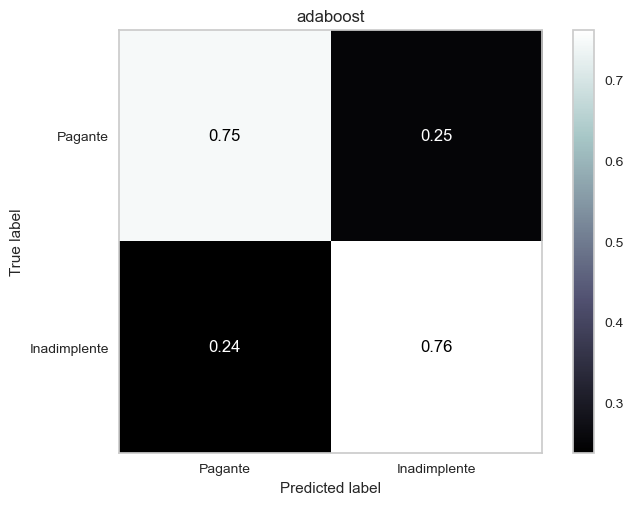

In [44]:
# Create a dictionary of the best models for each algorithm
best_models = {}

for trial in study.trials:
    model_name = trial.params['model']
    score = trial.value
    params = trial.params
    if model_name not in best_models or score > best_models[model_name]['score']:
        del params['model']
        best_models[model_name] = {'score': score, 'params': params}
        

best_lgbm_model = LGBMClassifier(**best_models['lgbm']['params'], is_unbalance=True)
best_xgb_model = XGBClassifier(**best_models['xgb']['params'], scale_pos_weight = (over_y_full_train == 0).sum() / (over_y_full_train == 1).sum())
best_adaboost_model = AdaBoostClassifier(**best_models['adaboost']['params'])

final_models = {
    'lgbm': best_lgbm_model,
    'xgb': best_xgb_model,
    'adaboost': best_adaboost_model,
    }

# Fit the best models on the entire training set and make predictions on the test set
test_preds = {}
for model_name, model in final_models.items():
    # Fit the pipeline on the training set
    model.fit(over_X_full_train, over_y_full_train)

    # Predict the target variable on the testing set
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:,1]

    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    auc_score = auc(recall, precision)
    print(model_name)
    print('PR AUC: %.3f' % auc_score)
    print('ROC AUC: %.3f' % roc_auc)

    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
    plt.title(model_name)
    plt.grid(False)

In [45]:
# Loop through the best_models dictionary and plot the ROC curves
for name, model in final_models.items():
    # Fit the pipeline on the training set
    model.fit(over_X_full_train, over_y_full_train)

    # Predict the target variable on the testing set
    y_pred = model.predict(X_test)

    # Print the classification report
    print(name)
    print(classification_report_imbalanced(y_test,y_pred))


lgbm
                   pre       rec       spe        f1       geo       iba       sup

          0       0.96      0.93      0.44      0.95      0.64      0.43     20534
          1       0.32      0.44      0.93      0.37      0.64      0.39      1466

avg / total       0.92      0.90      0.47      0.91      0.64      0.43     22000

xgb
                   pre       rec       spe        f1       geo       iba       sup

          0       0.95      0.98      0.22      0.96      0.46      0.23     20534
          1       0.40      0.22      0.98      0.28      0.46      0.20      1466

avg / total       0.91      0.93      0.27      0.92      0.46      0.23     22000

adaboost
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.75      0.76      0.85      0.75      0.57     20534
          1       0.18      0.76      0.75      0.29      0.75      0.57      1466

avg / total       0.92      0.75      0.76      0.81      0.7

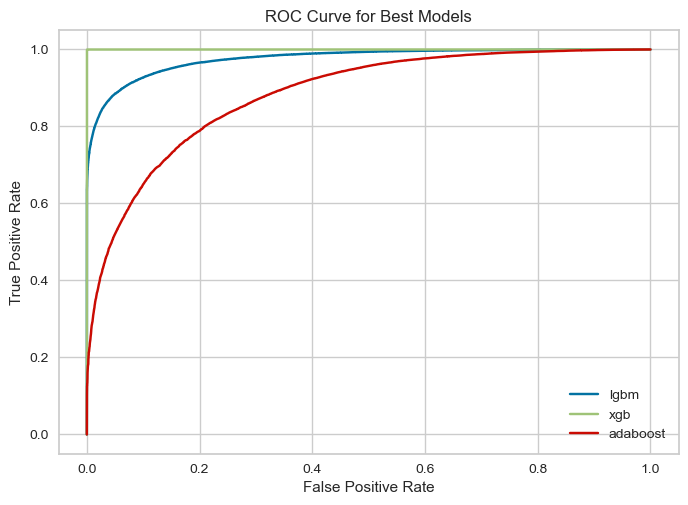

In [46]:
# Create a figure and axes for the plot
fig, ax = plt.subplots()

# Loop through the best_models dictionary and plot the ROC curves
for name, model in final_models.items():
    plot_roc_curve(model.fit(over_X_full_train, over_y_full_train), over_X_full_train, over_y_full_train, ax=ax, label=name)

# Set the title, xlabel, and ylabel
ax.set_title('ROC Curve for Best Models')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()

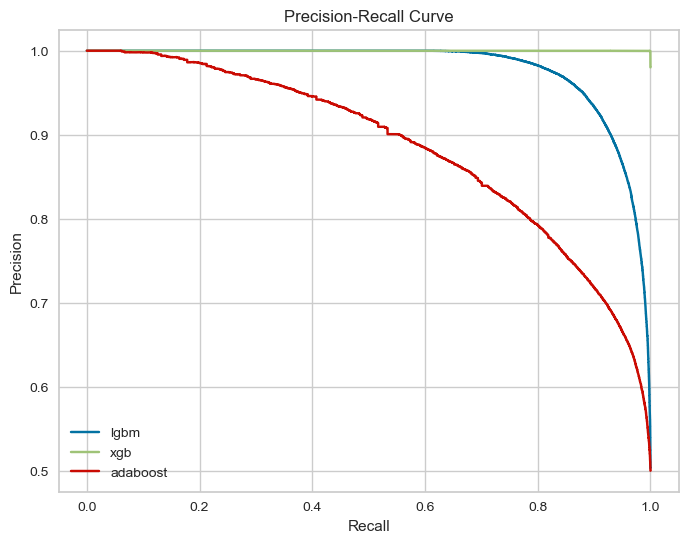

In [47]:
# plot precision-recall curves for all models
fig, ax = plt.subplots(figsize=(8, 6))
for model_name, model in final_models.items():
    plot_precision_recall_curve(model.fit(over_X_full_train, over_y_full_train), over_X_full_train, over_y_full_train, ax=ax, label=model_name)

# set plot title and labels
ax.set_title('Precision-Recall Curve')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()

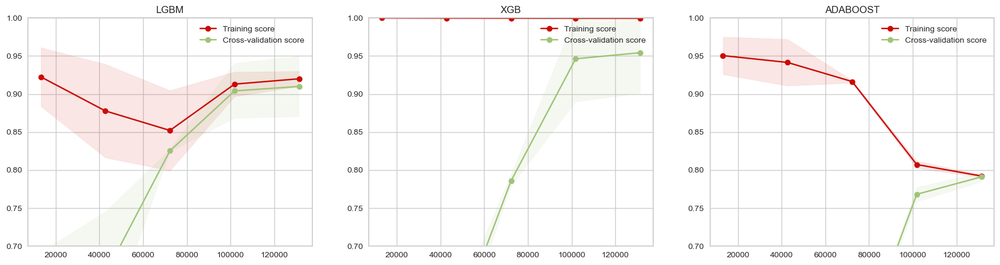

In [48]:
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):

        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='accuracy')

        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.7, 1)
        axes[i].grid()
        
    plt.show()

plot_multiple_learning_curves(final_models, over_X_full_train, over_y_full_train)

In [49]:
for name, model in best_models.items():
    now = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M')
    with open(f'models/optuna_over_{name}_{now}.pkl', 'wb') as file:
        pickle.dump(model, file)

### 4.4 Over+Undersampling

- Nesta subseção, é aplicada a técnica de combinação de oversampling e undersampling utilizando o algoritmo SMOTEENN (SMOTE + Edited Nearest Neighbors).
- O objetivo é gerar novas instâncias sintéticas da classe minoritária e remover instâncias da classe majoritária para ob- ter uma proporção de classes mais equilibrada.
- O modelo de regressão logística é ajustado nos dados resultantes da combinação do SMOTE e NearMiss, e seu desempenho é avaliado.

In [ ]:
sm = SMOTEENN(random_state=42)
overunder_X_full_train, overunder_y_full_train = sm.fit_resample(X_full_train, y_full_train)
overunder_X_train, overunder_y_train = sm.fit_resample(X_train, y_train)

In [50]:
# Define evaluation metric as F2 score
f2_score = make_scorer(fbeta_score, beta=2)

# Define objective function to be minimized by Optuna
def objective(trial):
     # Define hyperparameters to be tuned for the model
    model_name = trial.suggest_categorical('model', ['lgbm', 'xgb', 'adaboost'])

    if model_name == 'lgbm':
        params = {
            'num_leaves': trial.suggest_int('num_leaves', 2, 128),
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
        }
        model = LGBMClassifier(**params, is_unbalance=True)

    elif model_name == 'xgb':
        params = {
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'gamma': trial.suggest_loguniform('gamma', 0.001, 10.0),
            'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 10.0),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        }
        model = XGBClassifier(**params,  scale_pos_weight = (overunder_y_train == 0).sum() / (overunder_y_train == 1).sum())

    else:
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1)
        }
        model = AdaBoostClassifier(**params)

    model.fit(overunder_X_train, overunder_y_train)

    # Use cross_val_score to calculate the F2 score on the validation set
    scores = cross_val_score(model, overunder_X_full_train, overunder_y_full_train, cv=StratifiedKFold(), scoring=f2_score)

    # Return the mean score
    return scores.mean()

# Run Optuna to find the best hyperparameters for the three models
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=50, n_jobs=-1)

[I 2023-02-18 15:10:59,783] A new study created in memory with name: no-name-7e85681b-2276-4495-836d-3eb4db684218
[I 2023-02-18 15:12:28,401] Trial 1 finished with value: 0.8578818434892106 and parameters: {'model': 'lgbm', 'num_leaves': 32, 'max_depth': 8, 'learning_rate': 0.019120117204711375, 'min_child_samples': 97, 'subsample': 0.5649563150674737, 'colsample_bytree': 0.8335523309930692, 'reg_alpha': 0.01903349496151119, 'reg_lambda': 0.037547080047963505}. Best is trial 1 with value: 0.8578818434892106.
[I 2023-02-18 15:13:53,168] Trial 2 finished with value: 0.8295716580247035 and parameters: {'model': 'adaboost', 'n_estimators': 242, 'learning_rate': 0.004120623758555628}. Best is trial 1 with value: 0.8578818434892106.
[I 2023-02-18 15:14:06,030] Trial 0 finished with value: 0.8688399908404072 and parameters: {'model': 'xgb', 'max_depth': 10, 'learning_rate': 0.0014580069681022216, 'gamma': 0.08445333629549856, 'min_child_weight': 0.2225986024238822, 'subsample': 0.690593110377

lgbm
PR AUC: 0.324
ROC AUC: 0.844
xgb
PR AUC: 0.309
ROC AUC: 0.824
adaboost
PR AUC: 0.332
ROC AUC: 0.840


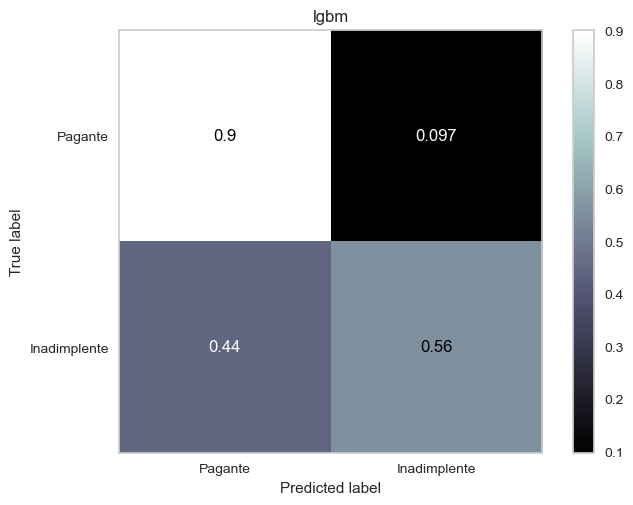

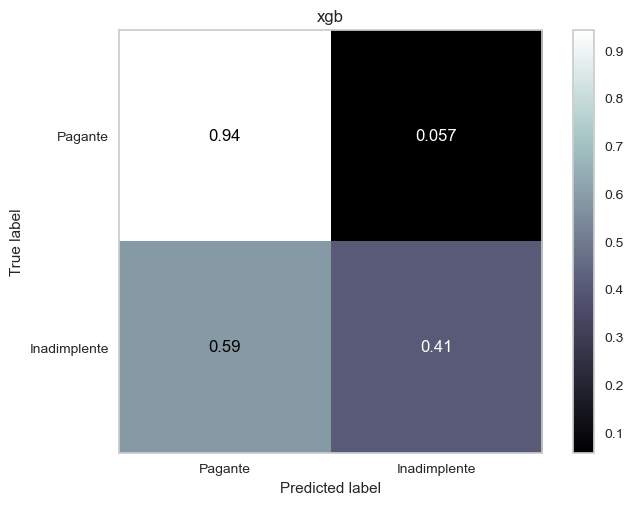

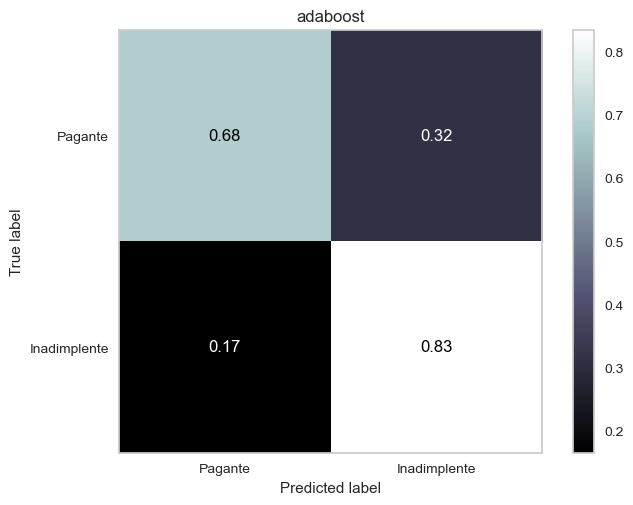

In [60]:
# Create a dictionary of the best models for each algorithm
best_models = {}

for trial in study.trials:
    model_name = trial.params['model']
    score = trial.value
    params = trial.params
    if model_name not in best_models or score > best_models[model_name]['score']:
        del params['model']
        best_models[model_name] = {'score': score, 'params': params}
        

best_lgbm_model = LGBMClassifier(**best_models['lgbm']['params'], is_unbalance=True)
best_xgb_model = XGBClassifier(**best_models['xgb']['params'], scale_pos_weight = (overunder_y_full_train == 0).sum() / (over_y_full_train == 1).sum())
best_adaboost_model = AdaBoostClassifier(**best_models['adaboost']['params'])

final_models = {
    'lgbm': best_lgbm_model,
    'xgb': best_xgb_model,
    'adaboost': best_adaboost_model,
    }

# Fit the best models on the entire training set and make predictions on the test set
test_preds = {}
for model_name, model in final_models.items():
    # Fit the pipeline on the training set
    model.fit(overunder_X_full_train, overunder_y_full_train)

    # Predict the target variable on the testing set
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:,1]

    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    auc_score = auc(recall, precision)
    print(model_name)
    print('PR AUC: %.3f' % auc_score)
    print('ROC AUC: %.3f' % roc_auc)

    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
    plt.title(model_name)
    plt.grid(False)

In [61]:
# Loop through the best_models dictionary and plot the ROC curves
for name, model in final_models.items():
    # Fit the pipeline on the training set
    model.fit(overunder_X_full_train, overunder_y_full_train)

    # Predict the target variable on the testing set
    y_pred = model.predict(X_test)

    # Print the classification report
    print(name)
    print(classification_report_imbalanced(y_test,y_pred))


lgbm
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      0.90      0.56      0.93      0.71      0.52     20534
          1       0.29      0.56      0.90      0.38      0.71      0.48      1466

avg / total       0.92      0.88      0.58      0.90      0.71      0.52     22000

xgb
                   pre       rec       spe        f1       geo       iba       sup

          0       0.96      0.94      0.41      0.95      0.62      0.40     20534
          1       0.34      0.41      0.94      0.37      0.62      0.36      1466

avg / total       0.92      0.91      0.44      0.91      0.62      0.40     22000

adaboost
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.68      0.83      0.81      0.76      0.56     20534
          1       0.16      0.83      0.68      0.27      0.76      0.58      1466

avg / total       0.93      0.69      0.82      0.77      0.7

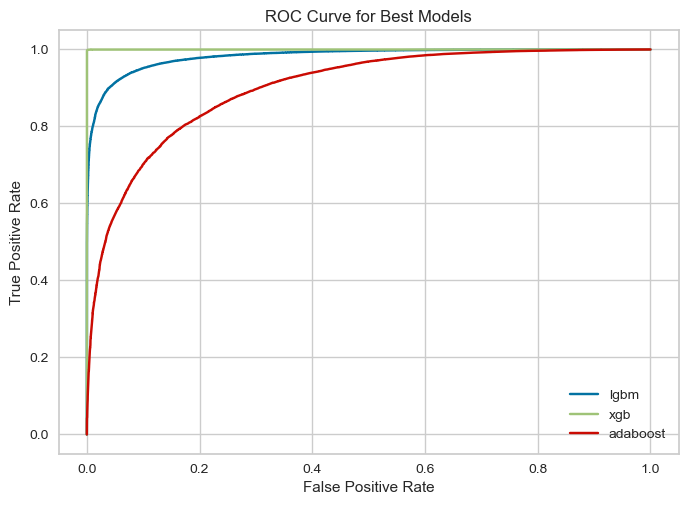

In [62]:
# Create a figure and axes for the plot
fig, ax = plt.subplots()

# Loop through the best_models dictionary and plot the ROC curves
for name, model in final_models.items():
    plot_roc_curve(model.fit(overunder_X_full_train, overunder_y_full_train), overunder_X_full_train, overunder_y_full_train, ax=ax, label=name)

# Set the title, xlabel, and ylabel
ax.set_title('ROC Curve for Best Models')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()

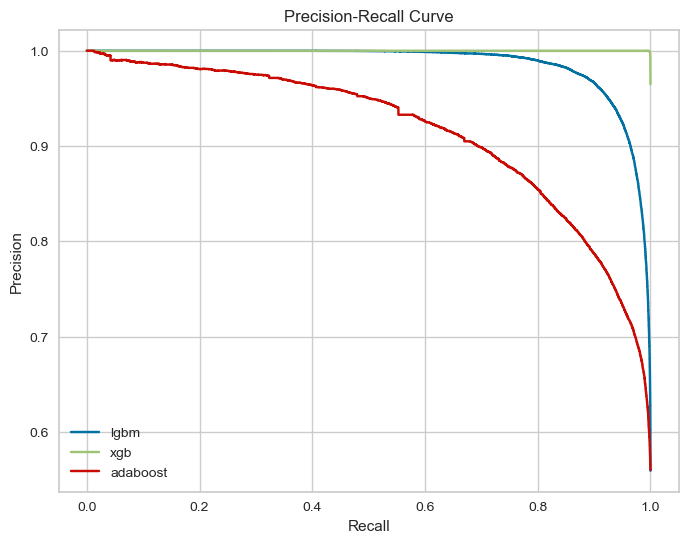

In [63]:
# plot precision-recall curves for all models
fig, ax = plt.subplots(figsize=(8, 6))
for model_name, model in final_models.items():
    plot_precision_recall_curve(model.fit(overunder_X_full_train, overunder_y_full_train), overunder_X_full_train, overunder_y_full_train, ax=ax, label=model_name)

# set plot title and labels
ax.set_title('Precision-Recall Curve')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')

# Add a legend to the plot
ax.legend()

# Show the plot
plt.show()

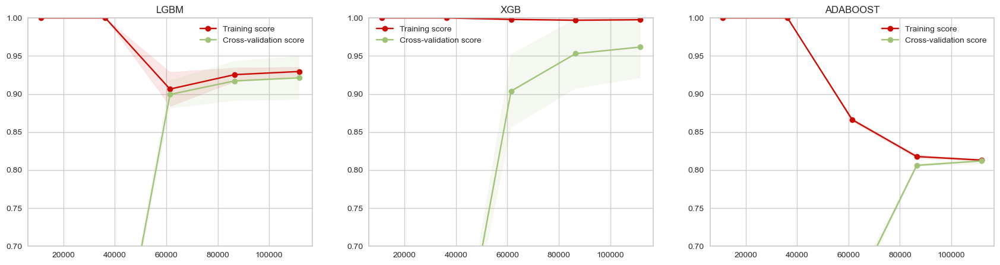

In [64]:
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):

        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='accuracy')

        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.7, 1)
        axes[i].grid()
        
    plt.show()

plot_multiple_learning_curves(final_models, overunder_X_full_train, overunder_y_full_train)

In [65]:
for name, model in best_models.items():
    now = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M')
    with open(f'models/optuna_overunder_{name}_{now}.pkl', 'wb') as file:
        pickle.dump(model, file)

## 5. Resultados e Avaliação
- Métricas utilizadas para avaliar os modelos
- Comparação do desempenho dos modelos
- Visualização dos resultados dos modelos


In [85]:
def open_params(path):
    with open(path, 'rb') as f:
        # Load the object from the file
        obj = pickle.load(f)['params']

    return obj

In [86]:
model = open_params('models\optuna_imbalanced_adaboost_2023-02-18-09-48.pkl')
model

{'n_estimators': 112, 'learning_rate': 0.07327964509817317}

In [91]:
from sklearn.preprocessing import FunctionTransformer



best_params = {
    'lgbm': {
        'pesos':open_params('models\optuna_imbalanced_lgbm_2023-02-18-09-48.pkl'),
        'under':open_params('models\optuna_under_lgbm_2023-02-18-10-13.pkl'),
        'over':open_params('models\optuna_over_lgbm_2023-02-18-15-10.pkl'),
        'overunder':open_params('models\optuna_overunder_lgbm_2023-02-18-17-12.pkl'),
    },
    'xgb': {
        'pesos':open_params('models\optuna_imbalanced_xgb_2023-02-18-09-48.pkl'),
        'under':open_params('models\optuna_under_xgb_2023-02-18-10-13.pkl'),
        'over':open_params('models\optuna_over_xgb_2023-02-18-15-10.pkl'),
        'overunder':open_params('models\optuna_overunder_xgb_2023-02-18-17-12.pkl'),
    },
    'ada': {
        'pesos':open_params('models\optuna_imbalanced_adaboost_2023-02-18-09-48.pkl'),
        'under':open_params('models\optuna_under_adaboost_2023-02-18-10-13.pkl'),
        'over':open_params('models\optuna_over_adaboost_2023-02-18-15-10.pkl'),
        'overunder':open_params('models\optuna_overunder_adaboost_2023-02-18-17-12.pkl'),
    },
}


In [134]:
from sklearn.metrics import average_precision_score
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Binarizer

from imblearn.pipeline import Pipeline, make_pipeline

def construir_pipe(sampling, model):
    preprocess = ColumnTransformer(
        [('imputing', KNNImputer(n_neighbors=2), variaveis_com_faltantes),
        ('discret', Binarizer(), variaveis_binarias),
        ('normal', YeoJohnsonTransformer, variaveis_outras_escalas),
        ('cap_norm',  Winsorizer(
                        capping_method="quantiles",
                        tail="both",
                        fold=0.05
                        ), variaveis_outras_escalas),
        ('cap_outliers', Winsorizer(
                        capping_method="quantiles",
                        tail="both",
                        fold=0.05
                        ), variaveis_outliers),
    ])

    smote_pipeline = Pipeline([
        ('smote', SMOTE()),
        ('model', model)
    ])

    nearmiss_pipeline = Pipeline([
        ('smote', NearMiss()),
        ('model', model)
    ])

    smoteenn_pipeline = Pipeline([
        ('smote', SMOTEENN()),
        ('model', model)
    ])

    pipelines = {
            'pesos': Pipeline(
                        preprocess,
                        model),
            'over': Pipeline(
                        preprocess,
                        smote_pipeline),
            'under': Pipeline(
                        preprocess,
                        nearmiss_pipeline),
            'overunder': Pipeline(
                        preprocess,
                        smoteenn_pipeline) 
    }
    return pipelines[sampling]


def train_models(X_train, y_train, X_test, y_test, sampling=None):
    trained_models = {}
    scores = []
    for model in best_params.keys():
        for params in best_params[model].keys():
            if params == sampling:
                clf = final_models[model]
                hyperparameters = best_params[model][params]
                clf.set_params(**hyperparameters)  # Set the hyperparameters for the classifier
                pipeline = construir_pipe(params, clf)
                pipeline.fit(X_train, y_train)
                display(pipeline)
                y_pred = pipeline.predict_proba(X_test)[:,1]
                aucroc = roc_auc_score(y_test, y_pred)
                aucpr = average_precision_score(y_test, y_pred)
                scores.append({'model': model, 'params': params, 'aucroc': aucroc, 'aucpr': aucpr})
                trained_models[model] = clf
            else:
                continue
    df_scores = pd.DataFrame(scores)
    display(df_scores)
    return trained_models, df_scores
models = train_models(X_full_train, y_full_train, X_test, y_test, 'pesos')

TypeError: Cannot clone object. You should provide an instance of scikit-learn estimator instead of a class.

## 6. Conclusão
- Resumo das descobertas
- Limitações e áreas para trabalhos futuros
- Conclusão


## 7. Apêndice
- Fragmentos de código ou dados adicionais utilizados no projeto
- Referências
